## Notes

In [216]:
# import os
# import pandas as pd
# import numpy as np

# os.listdir(path)                              # List files in a folder
# [f for f in os.listdir(path) if f.endswith(".csv_files")]  # List csv_files files only

# pd.read_csv_files(path)                             # Read csv_files file
# pd.read_csv_files(path, encoding="cp1252")          # Read csv_files with specified encoding
# pd.read_csv_files(path, usecols=["A", "B"])         # Read selected columns only

# df.dropna()                                   # Remove rows containing missing values
# df.dropna(subset=["Time", "Primary"])         # Remove rows missing selected values
# df.fillna(0)                                  # Replace missing values with 0
# df.isna()                                     # Check missing values
# df.isna().sum()                               # Count missing values per column

# pd.concat([df1, df2])                         # Combine DataFrames vertically
# pd.concat([df1, df2], ignore_index=True)      # Combine and create a new index
# pd.concat([df1, df2], axis=1)                 # Combine DataFrames horizontally

# pd.DataFrame({...})                           # Create a DataFrame
# df.copy()                                     # Create an independent copy

# df.shape                                      # Get (rows, columns)
# len(df)                                       # Get number of rows
# df.size                                       # Get total number of values
# df.head()                                     # Preview first 5 rows
# df.head(10)                                   # Preview first 10 rows
# df.tail()                                     # Preview last 5 rows
# df.sample(5)                                  # Show 5 random rows
# df.info()                                     # Show structure and data types
# df.describe()                                 # Show numerical summary statistics
# df.dtypes                                     # Show data type of every column

# df.columns                                    # View column names
# df.columns.tolist()                           # Convert column names to a list
# df.columns = df.columns.str.strip()           # Remove spaces around column names
# df.rename(columns={"Old": "New"})             # Rename one column
# df.rename(columns={"I1": "Primary", "I2": "Secondary"})  # Rename multiple columns

# df["Col"]                                     # Select one column as a Series
# df[["Col1", "Col2"]]                          # Select multiple columns
# df.loc[:, ["Col1", "Col2"]]                   # Select columns by name
# df.iloc[:, 0]                                 # Select first column by position
# df.iloc[0]                                    # Select first row
# df.iloc[0:5]                                  # Select first 5 rows

# df[df["Trial"] == 1]                          # Filter rows using one condition
# df[(df["Material"] == "Metal") & (df["Trial"] == 1)]  # Filter using multiple conditions
# df[df["Col"].isin(["A", "B"])]                # Keep selected values
# df.query("Trial == 1")                        # Filter using query syntax

# df.sort_values("Col")                         # Sort by one column
# df.sort_values(["Trial", "Time"])             # Sort by multiple columns
# df.sort_values("Col", ascending=False)        # Sort in descending order

# df.reset_index(drop=True)                     # Reset row index
# df.set_index("Time")                          # Set a column as the index

# df["NewCol"] = values                                 # Add or replace a column
# df["Difference"] = df["Primary"] - df["Secondary"]    # Create calculated column
# df.insert(1, "NewCol", values)                        # Insert column at a position
# df.drop(columns=["Col"])                              # Remove a column
# df.drop(index=[0, 1])                                 # Remove selected rows

# df["Col"].unique()                            # Get unique values
# df["Col"].nunique()                           # Count unique values
# df["Col"].value_counts()                      # Count occurrences of each value

# df.groupby("Col")                                                 # Group rows by one column
# df.groupby(["Material", "Trial"])                                 # Group using multiple columns
# df.groupby("Material")["Primary"].mean()                          # Mean Primary for each material
# df.groupby("Trial").agg({"Primary": "mean", "Secondary": "max"})  # Multiple summaries

# df["Col"].to_numpy()                          # Convert Series to NumPy array
# df["Col"].to_numpy(dtype=float)               # Convert to float NumPy array
# df["Col"].tolist()                            # Convert Series to Python list

# df["Col"].astype(float)                       # Convert column to float
# df["Col"].astype(str)                         # Convert column to string
# pd.to_numeric(df["Col"], errors="coerce")     # Convert to numeric; invalid values become NaN

# df["Col"].min()                               # Minimum value
# df["Col"].max()                               # Maximum value
# df["Col"].mean()                              # Mean
# df["Col"].median()                            # Median
# df["Col"].std()                               # Standard deviation
# df["Col"].sum()                               # Sum
# df["Col"].idxmax()                            # Index of maximum value
# df["Col"].idxmin()                            # Index of minimum value

# df.duplicated()                               # Check duplicate rows
# df.drop_duplicates()                          # Remove duplicate rows

# df.replace([np.inf, -np.inf], np.nan)         # Replace infinities with NaN
# df.loc[mask]                                  # Select rows using a Boolean mask

# df.to_csv_files("output.csv_files", index=False)          # Save DataFrame to csv_files
# df.to_excel("output.xlsx", index=False)       # Save DataFrame to Excel

# pd.set_option("display.max_columns", None)     # Display all columns
# pd.set_option("display.max_rows", None)        # Display all rows
# pd.reset_option("display.max_columns")         # Reset column display setting
# pd.reset_option("display.max_rows")            # Reset row display setting

# Sensor Data Exploration
This notebook provides a concise workflow for exploring multiple sensor datasets with pandas. It covers:

- Loading sensor files (CSV/JSON) and combining them into a single DataFrame.
- Parsing and aligning timestamps, setting a datetime index.
- Cleaning steps: handling missing values, duplicates, outliers, and unit/column harmonization.
- Quick descriptive statistics, group summaries by sensor/type, and checks for data quality.
- Time-series operations: resampling, rolling aggregates, and interpolation to common frequencies.
- Visualizations: time series plots, distributions, correlation matrices, and simple anomaly detection.
- Exporting cleaned datasets and prepared features for downstream modeling or reporting.

Expected inputs: one or more files containing timestamp, sensor_id (or similar), and measurement columns.  
Outputs: a cleaned, merged DataFrame, summary tables, and plots to guide further analysis.

In [217]:
# Standard library
import itertools
import math
import os

# Data and plotting
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.ticker import ScalarFormatter
from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter, LogLocator

# Scientific computing
from scipy.integrate import trapezoid
from scipy.signal import correlate, correlation_lags, savgol_filter
from scipy.spatial import ConvexHull
from scipy.stats import linregress

# Scikit-learn
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.model_selection import GroupShuffleSplit, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, RobustScaler, StandardScaler
from sklearn.svm import SVC

# Time-series methods
from pyts.image import GramianAngularField
from pyts.transformation import ROCKET
from reservoirpy.nodes import Reservoir
from tsfresh import extract_features
from tsfresh.feature_extraction import EfficientFCParameters, MinimalFCParameters

In [218]:
DATE = '2026-07-08'

data_path = f"../data/02_preprocessed/{DATE}/"
files = os.listdir(f"{data_path}")
files

['carbon_2.csv',
 'aluminum_5.csv',
 'wood_3.csv',
 'wood_2.csv',
 'aluminum_4.csv',
 'carbon_3.csv',
 'cork_fine_1.csv',
 'cork_fine_3.csv',
 'carbon_1.csv',
 'aluminum_6.csv',
 'wood_1.csv',
 'temp',
 'cork_fine_2.csv',
 'cork_fine_6.csv',
 'aluminum_3.csv',
 'carbon_4.csv',
 'wood_5.csv',
 '.DS_Store',
 'wood_4.csv',
 'carbon_5.csv',
 'aluminum_2.csv',
 'cork_fine_5.csv',
 'wood_6.csv',
 'carbon_6.csv',
 'aluminum_1.csv',
 'cork_fine_4.csv',
 'nickel_3.csv',
 'titanium_6.csv',
 'nickel_2.csv',
 'titanium_5.csv',
 'titanium_4.csv',
 'nickel_1.csv',
 'nickel_5.csv',
 'titanium_1.csv',
 'nickel_4.csv',
 'nickel_6.csv',
 'titanium_3.csv',
 'titanium_2.csv',
 'gypsum_2.csv',
 'gypsum_3.csv',
 'gypsum_1.csv',
 'gypsum_4.csv',
 'gypsum_5.csv',
 'gypsum_6.csv',
 'bismuth_5.csv',
 'pdms_1.csv',
 'iron_3.csv',
 'cement_3.csv',
 'pu_foam_4.csv',
 'copper_1.csv',
 'pu_foam_5.csv',
 'iron_2.csv',
 'cement_2.csv',
 'bismuth_4.csv',
 'bismuth_6.csv',
 'pdms_2.csv',
 'copper_3.csv',
 'pu_foam_6.csv

#  Plot the sensor data

In [219]:
for f in files:
    print(f"{data_path}{f}")

../data/02_preprocessed/2026-07-08/carbon_2.csv
../data/02_preprocessed/2026-07-08/aluminum_5.csv
../data/02_preprocessed/2026-07-08/wood_3.csv
../data/02_preprocessed/2026-07-08/wood_2.csv
../data/02_preprocessed/2026-07-08/aluminum_4.csv
../data/02_preprocessed/2026-07-08/carbon_3.csv
../data/02_preprocessed/2026-07-08/cork_fine_1.csv
../data/02_preprocessed/2026-07-08/cork_fine_3.csv
../data/02_preprocessed/2026-07-08/carbon_1.csv
../data/02_preprocessed/2026-07-08/aluminum_6.csv
../data/02_preprocessed/2026-07-08/wood_1.csv
../data/02_preprocessed/2026-07-08/temp
../data/02_preprocessed/2026-07-08/cork_fine_2.csv
../data/02_preprocessed/2026-07-08/cork_fine_6.csv
../data/02_preprocessed/2026-07-08/aluminum_3.csv
../data/02_preprocessed/2026-07-08/carbon_4.csv
../data/02_preprocessed/2026-07-08/wood_5.csv
../data/02_preprocessed/2026-07-08/.DS_Store
../data/02_preprocessed/2026-07-08/wood_4.csv
../data/02_preprocessed/2026-07-08/carbon_5.csv
../data/02_preprocessed/2026-07-08/alumin

In [220]:
data = pd.DataFrame()
for f in files:
    #print(f)
    #if not f.lower().endswith(".csv"):
    #    continue
    if f.lower().endswith(".csv"):
        df = pd.read_csv(f"{data_path}{f}").dropna()
        data = pd.concat([data, df], ignore_index=True)
data['Sample'] = data['Sample'].str.lower()
data

,index,Sample,Trial,k,Time,Primary,Secondary
0,0,carbon,2,8.50,0.00937,0.000661,0.000699
1,1,carbon,2,8.50,0.10066,0.000661,0.000699
2,2,carbon,2,8.50,0.20070,0.000661,0.000699
3,3,carbon,2,8.50,0.30070,0.000661,0.000699
4,4,carbon,2,8.50,0.40066,0.000661,0.000699
...,...,...,...,...,...,...,...
17924,213,bismuth,1,7.92,21.30071,0.000651,0.000691
17925,214,bismuth,1,7.92,21.40070,0.000651,0.000691
17926,215,bismuth,1,7.92,21.50066,0.000651,0.000691
17927,216,bismuth,1,7.92,21.60070,0.000651,0.000691


In [221]:
materials = list(data['Sample'].unique())
materials

['carbon',
 'aluminum',
 'wood',
 'cork_fine',
 'nickel',
 'titanium',
 'gypsum',
 'bismuth',
 'pdms',
 'iron',
 'cement',
 'pu_foam',
 'copper']

In [222]:
material_groups = {
'bismuth': 'metal',
'nickel': 'metal',
'titanium': 'metal',
'iron': 'metal',
'aluminum': 'metal',
'copper': 'metal',
'cement': 'ceramic',
'gypsum': 'ceramic',
'carbon': 'ceramic',
#'cork_coarse': 'composite',
'cork_fine': 'composite',
'wood': 'composite',
#'abrasive': 'composite',
'pdms': 'polymer',
'ps_foam': 'foam',
'pu_foam': 'foam'}
data['Label'] = data['Sample'].apply(lambda x: material_groups[x])

data.head()

,index,Sample,Trial,k,Time,Primary,Secondary,Label
0,0,carbon,2,8.5,0.00937,0.000661,0.000699,ceramic
1,1,carbon,2,8.5,0.10066,0.000661,0.000699,ceramic
2,2,carbon,2,8.5,0.20070,0.000661,0.000699,ceramic
3,3,carbon,2,8.5,0.30070,0.000661,0.000699,ceramic
4,4,carbon,2,8.5,0.40066,0.000661,0.000699,ceramic


## Plot all materials

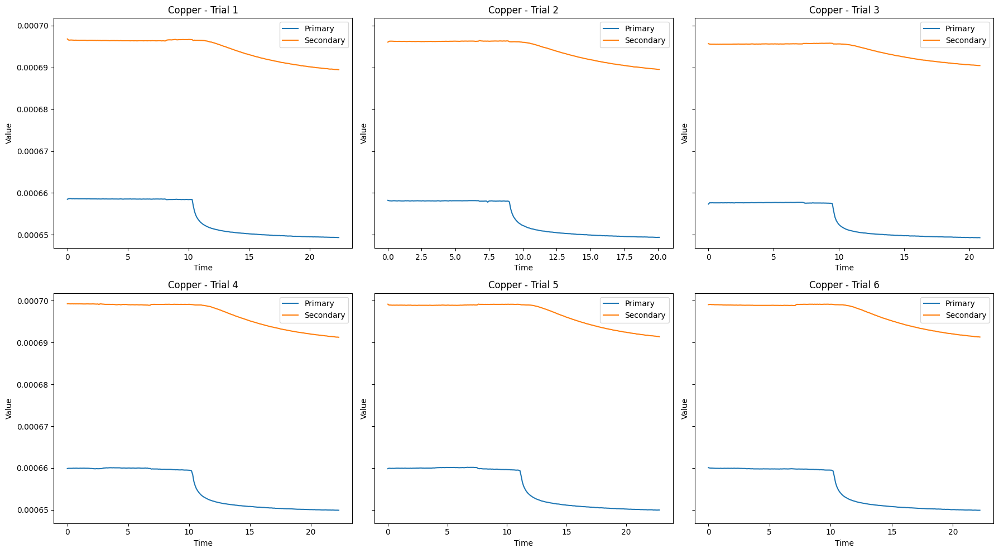

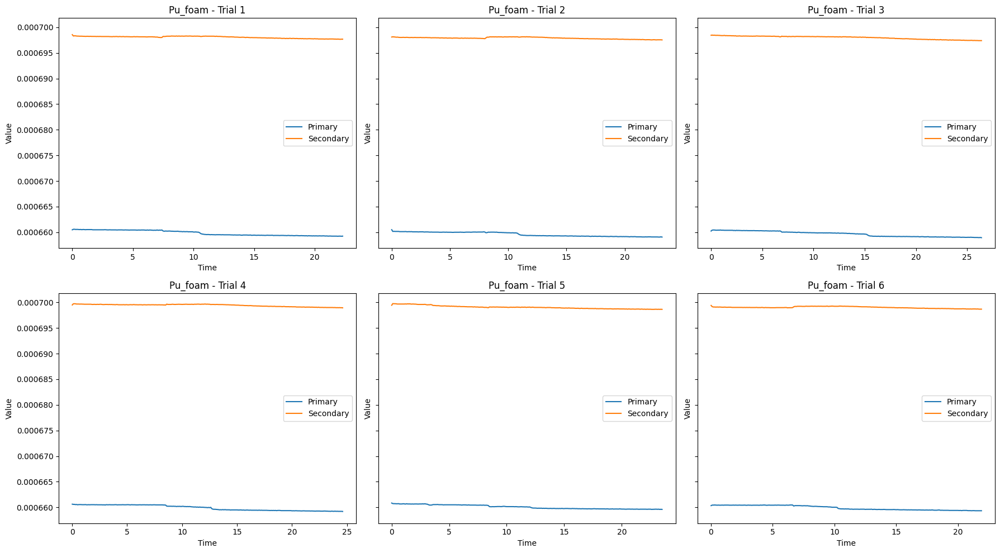

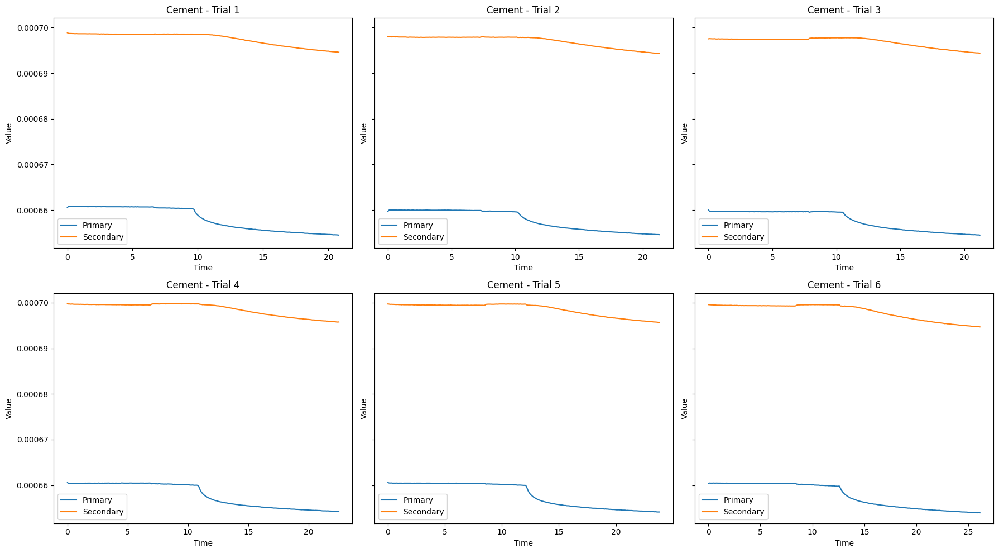

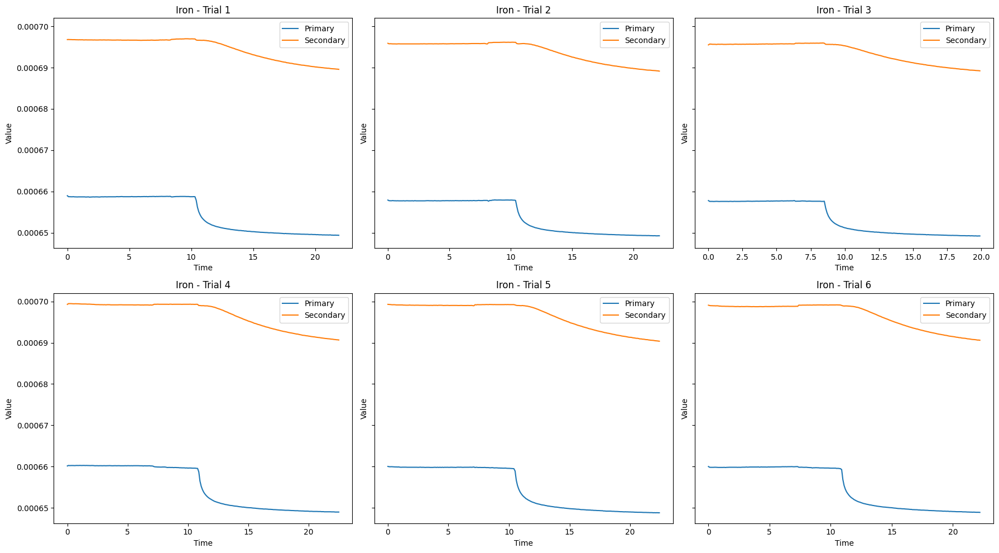

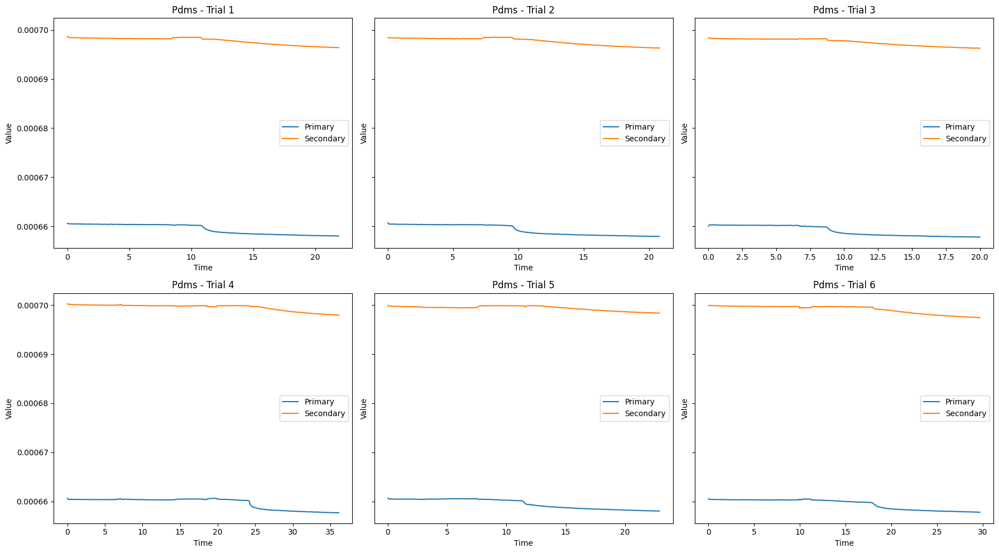

...

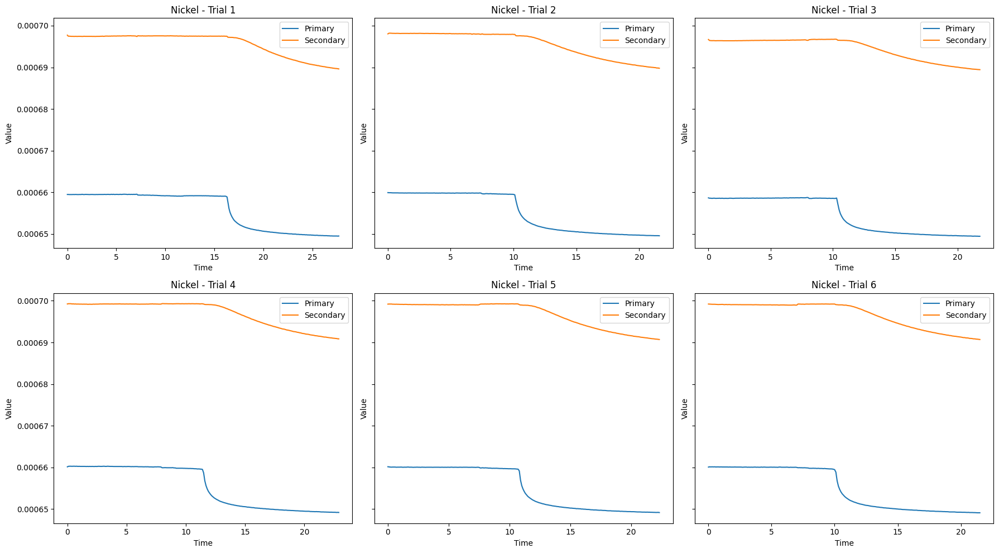

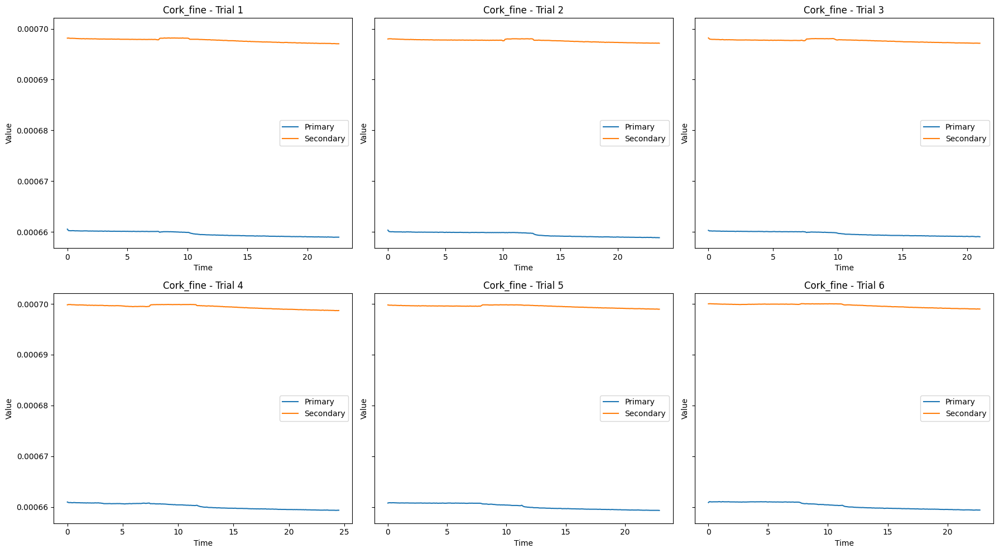

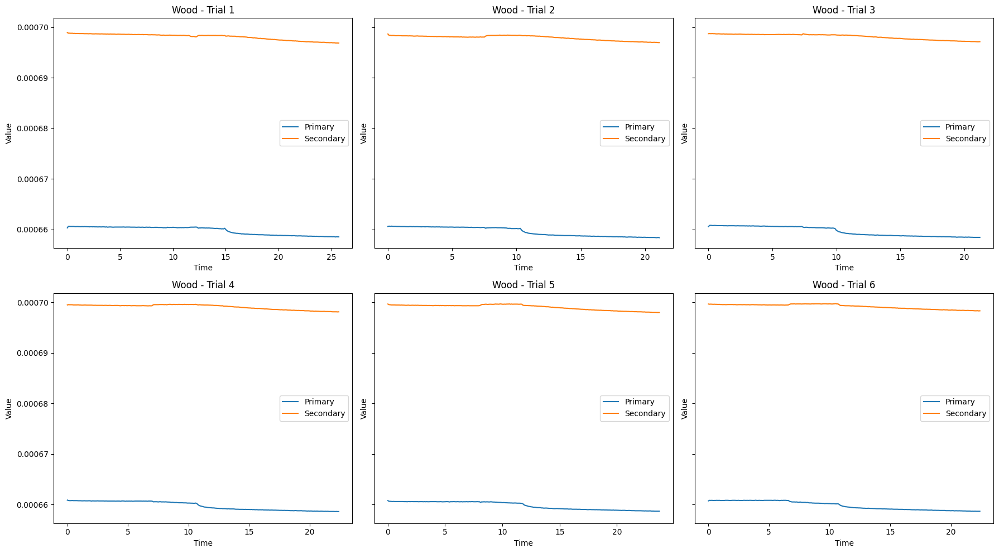

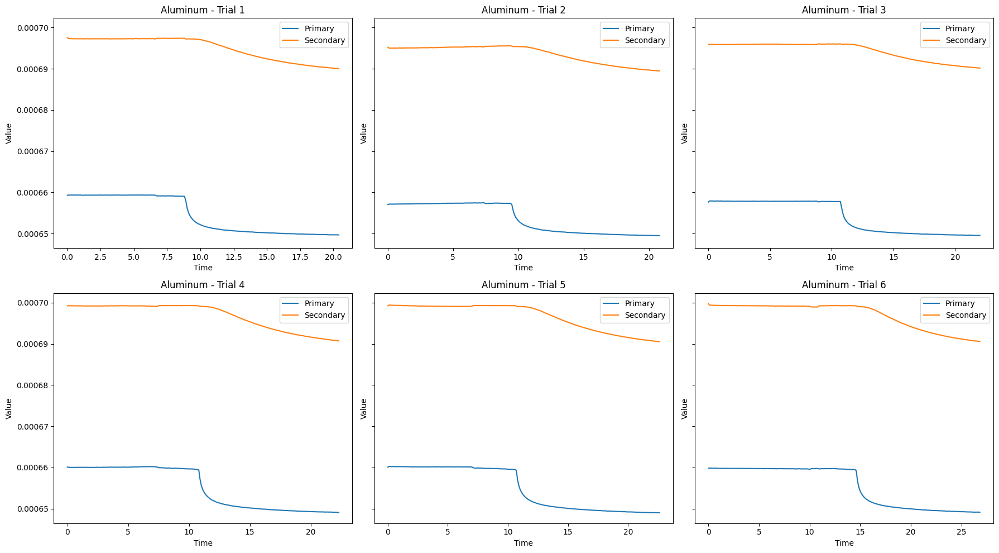

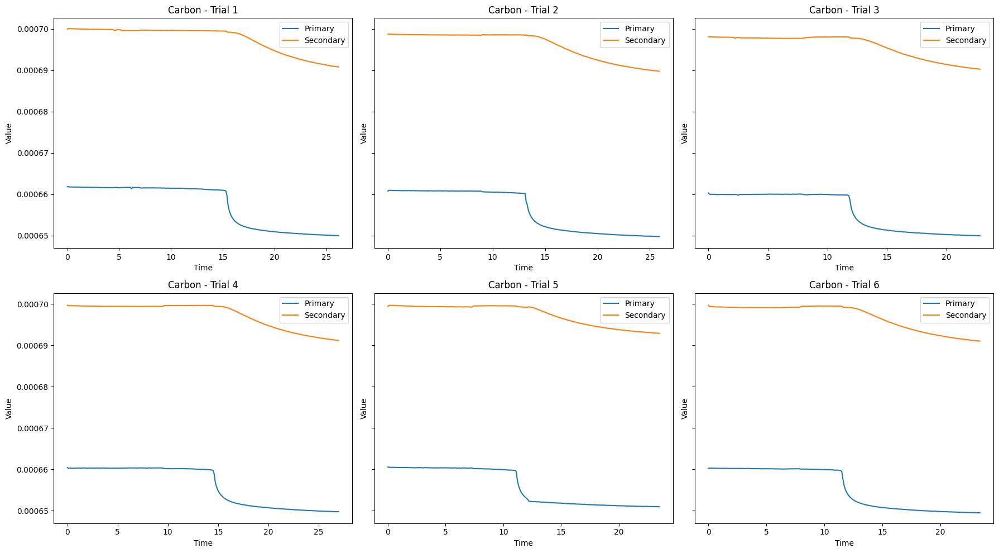

In [223]:
for m in materials[::-1]:

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(18, 10),
        sharey=True
    )

    axes = axes.ravel()

    for i, ax in enumerate(axes):

        trial_no = i + 1

        subset = data[
            (data["Sample"] == m)
            & (data["Trial"] == trial_no)
        ].sort_values("Time")

        if subset.empty:
            ax.axis("off")
            continue

        ax.plot(
            subset["Time"].values,
            subset["Primary"].values,
            label="Primary"
        )

        ax.plot(
            subset["Time"].values,
            subset["Secondary"].values,
            label="Secondary"
        )

        ax.set_xlabel("Time")
        ax.set_ylabel("Value")
        ax.set_title(f"{m.capitalize()} - Trial {trial_no}")
        ax.legend()

    plt.tight_layout()
    plt.show()

## Plot Primary-Secondary Differnce

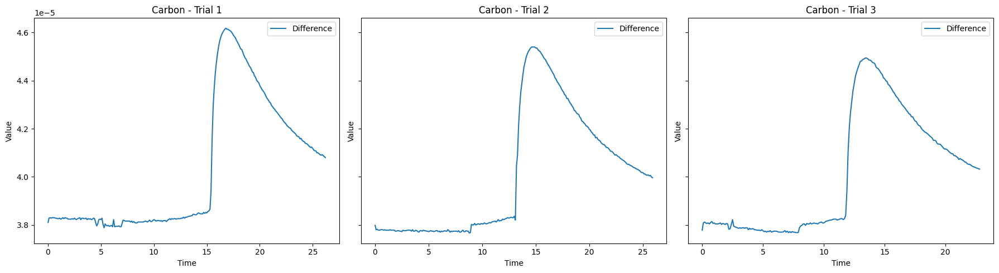

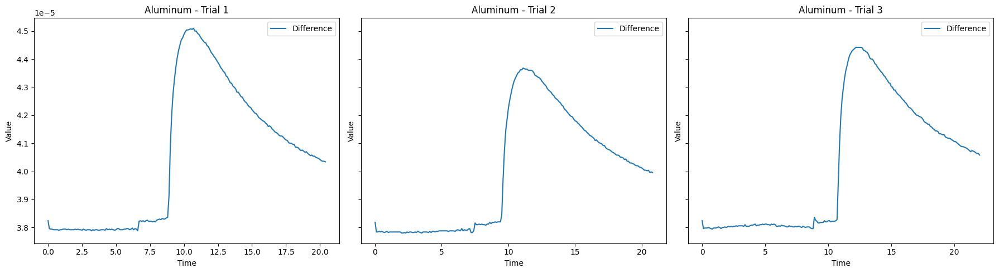

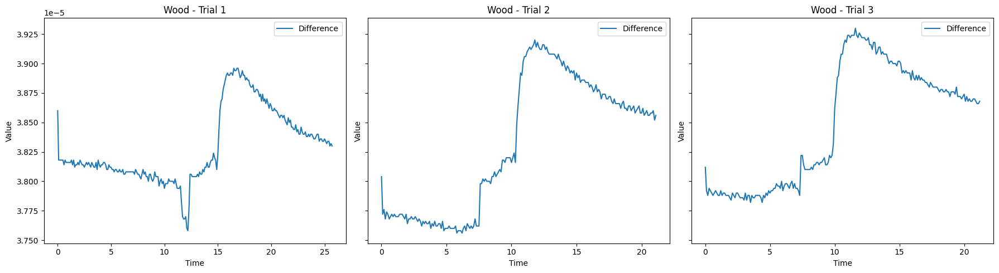

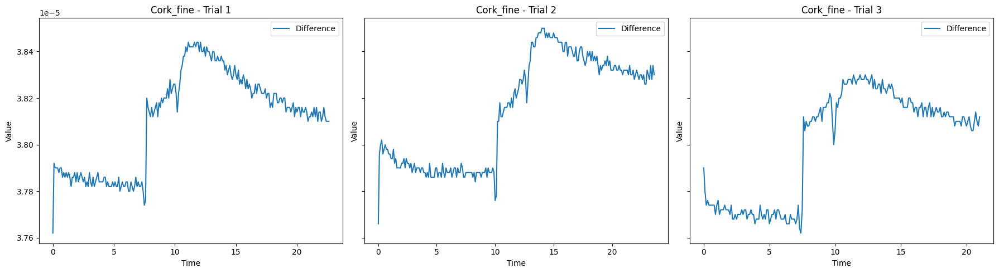

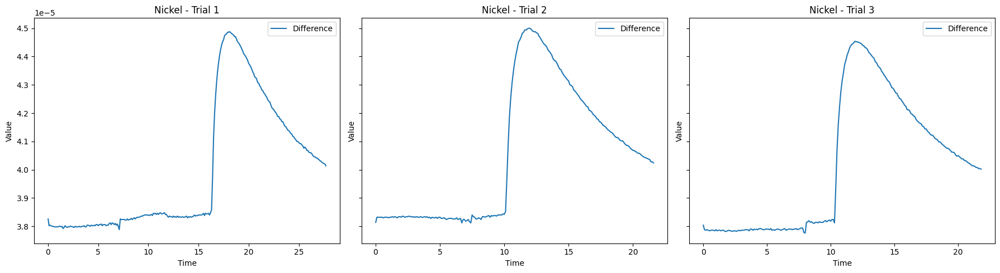

...

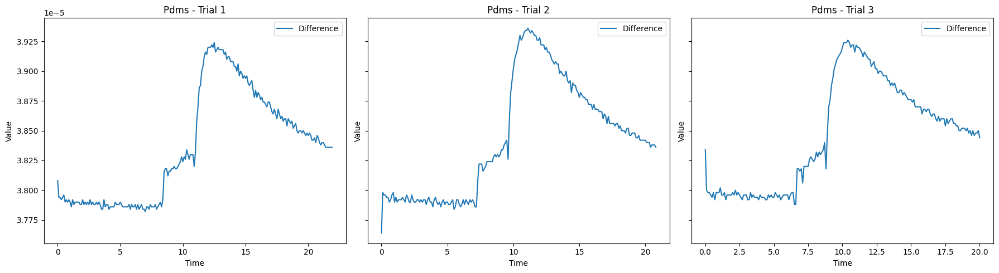

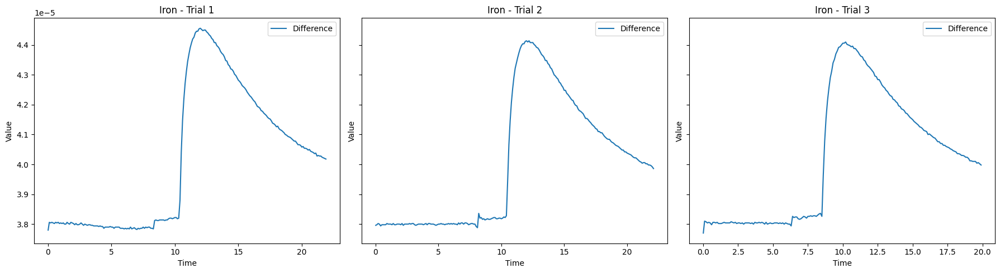

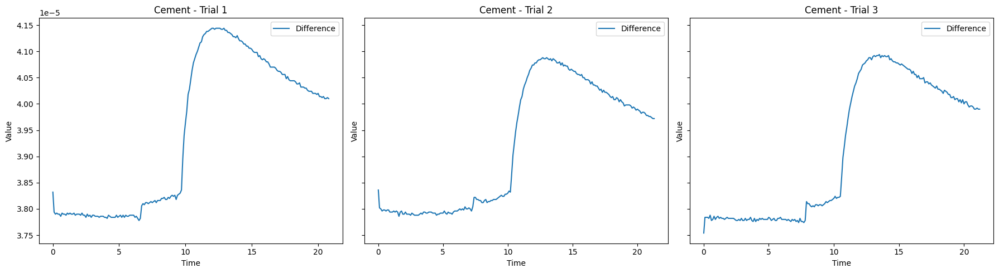

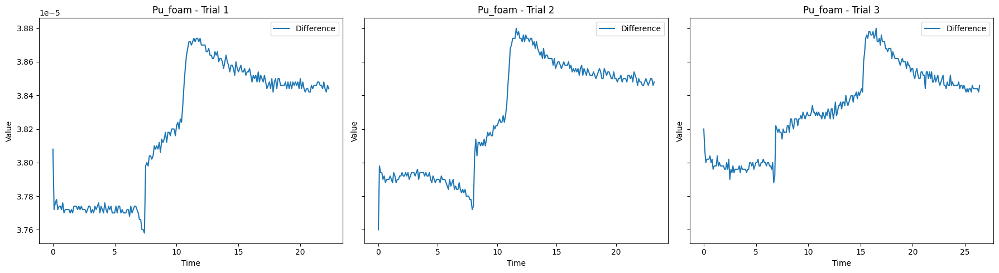

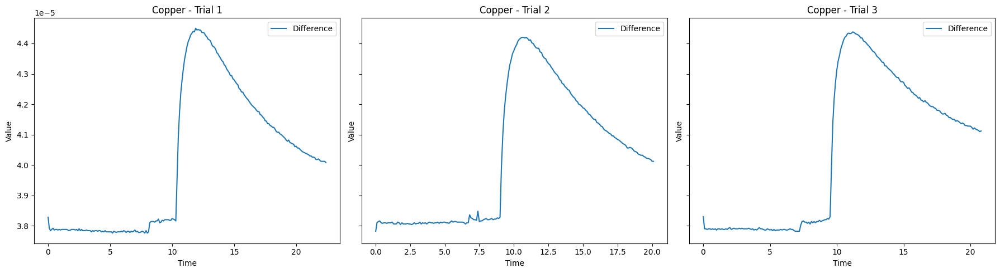

In [224]:
data['diff'] = data['Secondary'] - data['Primary']
data['abs_diff'] = data['diff'].abs()

# Plotting Primary and Secondary Readings Over Time
for m in materials:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    for i, ax in enumerate(axes):
        subset = data[(data['Sample'] == m) & (data['Trial'] == i+1)]

        ax.plot(subset['Time'].values, subset['diff'], label='Difference')
        ax.set_xlabel('Time')

        ax.set_ylabel('Value')
        ax.set_title(f'{m.capitalize()} - Trial {i+1}')
        ax.legend()

    plt.tight_layout()
    plt.show()

# Elbow Finder

carbon - Trial 1 - index: 151, time: 15.101
carbon - Trial 2 - index: 129, time: 12.901
carbon - Trial 3 - index: 116, time: 11.601
carbon - Trial 4 - index: 143, time: 14.301
carbon - Trial 5 - index: 108, time: 10.801
carbon - Trial 6 - index: 112, time: 11.201


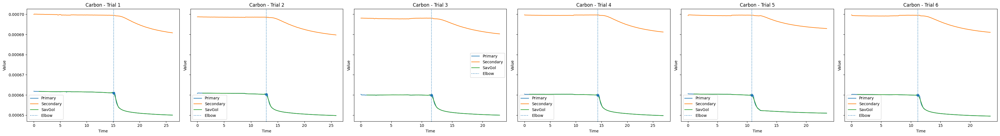

aluminum - Trial 1 - index: 86, time: 8.601
aluminum - Trial 2 - index: 92, time: 9.201
aluminum - Trial 3 - index: 105, time: 10.501
aluminum - Trial 4 - index: 105, time: 10.501
aluminum - Trial 5 - index: 104, time: 10.401
aluminum - Trial 6 - index: 143, time: 14.301


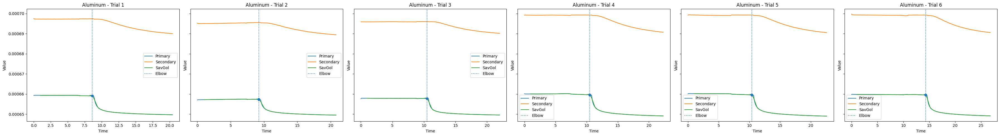

wood - Trial 1 - index: 147, time: 14.701
wood - Trial 2 - index: 101, time: 10.101
wood - Trial 3 - index: 96, time: 9.601
wood - Trial 4 - index: 104, time: 10.401
wood - Trial 5 - index: 115, time: 11.501
wood - Trial 6 - index: 104, time: 10.401


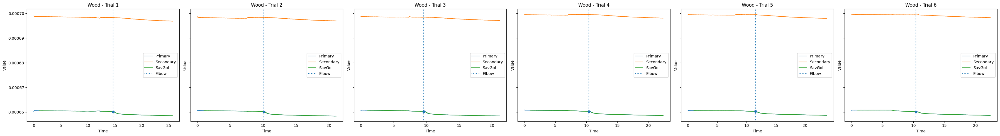

cork_fine - Trial 1 - index: 98, time: 9.801
cork_fine - Trial 2 - index: 122, time: 12.201
cork_fine - Trial 3 - index: 95, time: 9.501
cork_fine - Trial 4 - index: 114, time: 11.401
cork_fine - Trial 5 - index: 110, time: 11.001
cork_fine - Trial 6 - index: 73, time: 7.301


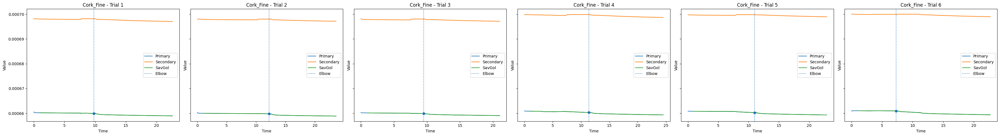

nickel - Trial 1 - index: 161, time: 16.101
nickel - Trial 2 - index: 99, time: 9.901
nickel - Trial 3 - index: 101, time: 10.101
nickel - Trial 4 - index: 112, time: 11.201
nickel - Trial 5 - index: 105, time: 10.501
nickel - Trial 6 - index: 98, time: 9.801


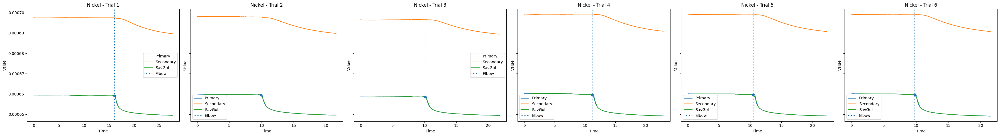

titanium - Trial 1 - index: 84, time: 8.401
titanium - Trial 2 - index: 87, time: 8.701
titanium - Trial 3 - index: 95, time: 9.501
titanium - Trial 4 - index: 118, time: 11.801
titanium - Trial 5 - index: 108, time: 10.801
titanium - Trial 6 - index: 106, time: 10.601


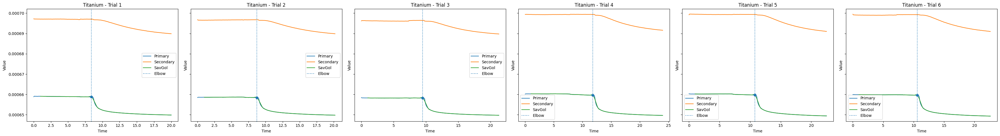

gypsum - Trial 1 - index: 113, time: 11.301
gypsum - Trial 2 - index: 107, time: 10.701
gypsum - Trial 3 - index: 101, time: 10.101
gypsum - Trial 4 - index: 104, time: 10.401
gypsum - Trial 5 - index: 107, time: 10.701
gypsum - Trial 6 - index: 109, time: 10.901


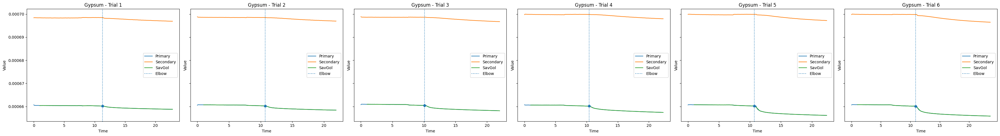

bismuth - Trial 1 - index: 100, time: 10.001
bismuth - Trial 2 - index: 97, time: 9.701
bismuth - Trial 3 - index: 93, time: 9.301
bismuth - Trial 4 - index: 113, time: 11.301
bismuth - Trial 5 - index: 117, time: 11.701
bismuth - Trial 6 - index: 108, time: 10.801


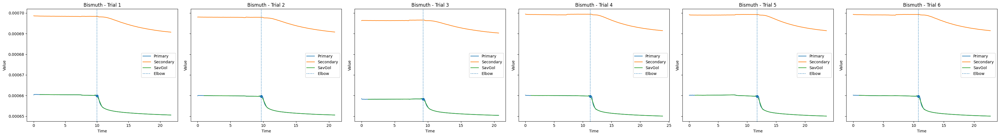

pdms - Trial 1 - index: 106, time: 10.601
pdms - Trial 2 - index: 93, time: 9.301
pdms - Trial 3 - index: 85, time: 8.501
pdms - Trial 4 - index: 239, time: 23.901
pdms - Trial 5 - index: 111, time: 11.101
pdms - Trial 6 - index: 177, time: 17.701


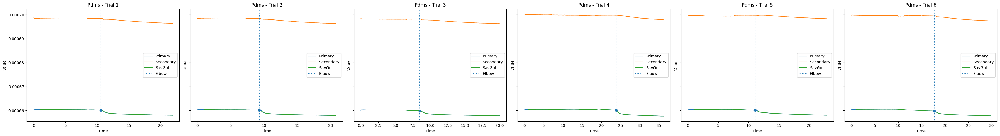

iron - Trial 1 - index: 101, time: 10.101
iron - Trial 2 - index: 102, time: 10.201
iron - Trial 3 - index: 83, time: 8.301
iron - Trial 4 - index: 106, time: 10.601
iron - Trial 5 - index: 102, time: 10.201
iron - Trial 6 - index: 106, time: 10.601


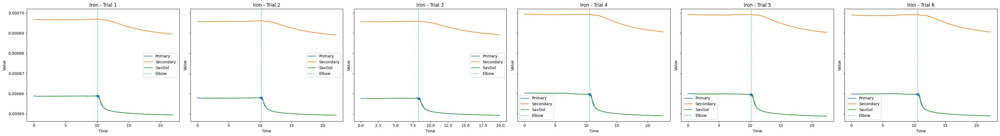

cement - Trial 1 - index: 95, time: 9.501
cement - Trial 2 - index: 100, time: 10.001
cement - Trial 3 - index: 103, time: 10.301
cement - Trial 4 - index: 106, time: 10.601
cement - Trial 5 - index: 119, time: 11.901
cement - Trial 6 - index: 124, time: 12.401


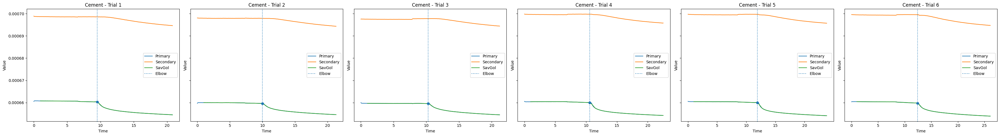

pu_foam - Trial 1 - index: 101, time: 10.101
pu_foam - Trial 2 - index: 105, time: 10.501
pu_foam - Trial 3 - index: 149, time: 14.901
pu_foam - Trial 4 - index: 122, time: 12.201
pu_foam - Trial 5 - index: 80, time: 8.001
pu_foam - Trial 6 - index: 98, time: 9.801


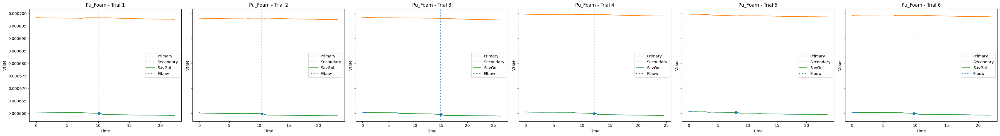

copper - Trial 1 - index: 101, time: 10.101
copper - Trial 2 - index: 87, time: 8.701
copper - Trial 3 - index: 92, time: 9.201
copper - Trial 4 - index: 100, time: 10.001
copper - Trial 5 - index: 109, time: 10.901
copper - Trial 6 - index: 100, time: 10.001


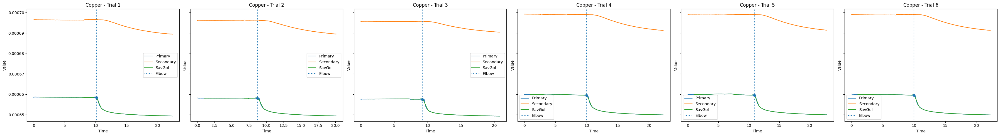

In [225]:
def find_first_elbow(
    subset,
    time_col="Time",
    signal_col="Primary",
    index_col="index",
    smooth_window=15,
    polyorder=2,
    threshold_frac=0.30,
    direction="drop",
    skip_index=10,
):
    # Sort while preserving the stored index values
    df = subset.sort_values(time_col, kind="stable").reset_index(drop=True)

    indices = (
        df[index_col].to_numpy()
        if index_col in df.columns
        else np.arange(len(df))
    )

    # Skip initial points
    df = df.iloc[skip_index:]
    indices = indices[skip_index:]

    time = df[time_col].to_numpy(dtype=float)
    signal = df[signal_col].to_numpy(dtype=float)

    # Remove invalid values
    valid = np.isfinite(time) & np.isfinite(signal)

    time = time[valid]
    signal = signal[valid]
    indices = indices[valid]

    n = len(signal)

    if n < 3:
        return np.nan, np.nan, None, time, signal

    # Savitzky–Golay requires an odd window
    window = min(smooth_window, n)

    if window % 2 == 0:
        window -= 1

    if window <= polyorder:
        window = polyorder + 1

        if window % 2 == 0:
            window += 1

    if window > n:
        return np.nan, np.nan, None, time, signal

    smooth_signal = savgol_filter(
        signal,
        window_length=window,
        polyorder=polyorder
    )

    derivative = np.gradient(smooth_signal, time)

    if direction == "drop":
        strongest_idx = np.argmin(derivative)
        active = (
            derivative
            < threshold_frac * derivative[strongest_idx]
        )

    elif direction == "rise":
        strongest_idx = np.argmax(derivative)
        active = (
            derivative
            > threshold_frac * derivative[strongest_idx]
        )

    else:
        raise ValueError("direction must be 'drop' or 'rise'")

    # Search backward for the beginning of the strong response
    elbow_position = 0

    for position in range(strongest_idx, -1, -1):
        if not active[position]:
            elbow_position = position + 1
            break

    return (
        time[elbow_position],
        signal[elbow_position],
        indices[elbow_position],
        time,
        smooth_signal
    )


# Automatically obtain materials
materials = data["Sample"].dropna().unique()

elbow_loc = {}

for material in materials:

    material_data = data[data["Sample"] == material]

    trials = sorted(
        material_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    fig, axes = plt.subplots(
        1,
        len(trials),
        figsize=(6 * len(trials), 5),
        sharey=True,
        squeeze=False
    )

    axes = axes.ravel()
    elbow_loc[material] = {}

    for ax, trial in zip(axes, trials):

        subset = material_data[
            material_data["Trial"].astype(int) == trial
        ].sort_values("Time")

        (
            elbow_time,
            elbow_value,
            elbow_idx,
            smooth_time,
            smooth_primary
        ) = find_first_elbow(subset)

        elbow_loc[material][trial] = elbow_idx

        print(
            f"{material} - Trial {trial} - "
            f"index: {elbow_idx}, time: {elbow_time:.3f}"
        )

        ax.plot(
            subset["Time"],
            subset["Primary"],
            label="Primary"
        )

        ax.plot(
            subset["Time"],
            subset["Secondary"],
            label="Secondary"
        )

        ax.plot(
            smooth_time,
            smooth_primary,
            label="SavGol"
        )

        if np.isfinite(elbow_time):
            ax.axvline(
                elbow_time,
                linestyle=":",
                label="Elbow"
            )

            ax.scatter(
                elbow_time,
                elbow_value,
                zorder=5
            )

        ax.set(
            title=f"{material.title()} - Trial {trial}",
            xlabel="Time",
            ylabel="Value"
        )

        ax.legend()

    plt.tight_layout()
    plt.show()

carbon - Trial 1 - 151
carbon - Trial 2 - 129
carbon - Trial 3 - 116
carbon - Trial 4 - 143
carbon - Trial 5 - 108
carbon - Trial 6 - 112


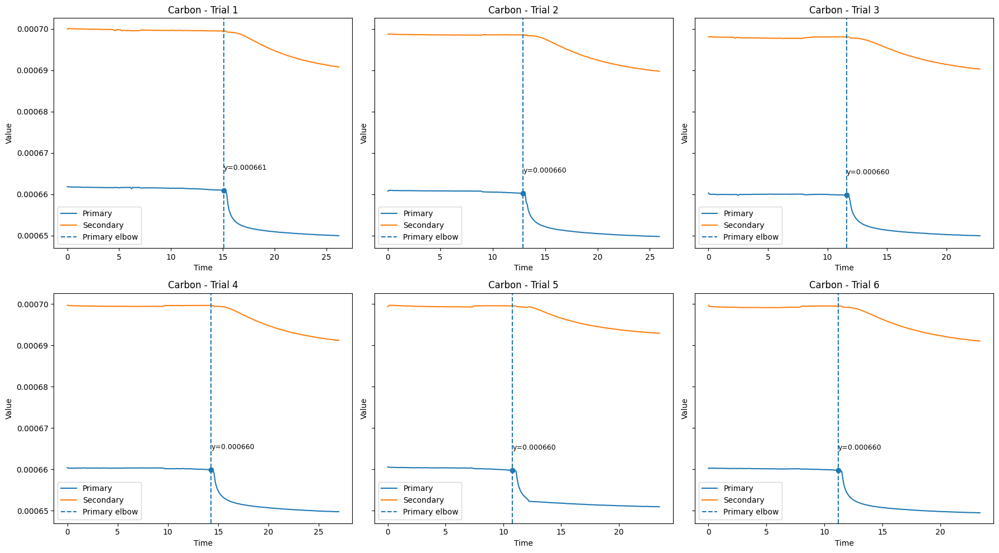

aluminum - Trial 1 - 86
aluminum - Trial 2 - 92
aluminum - Trial 3 - 105
aluminum - Trial 4 - 105
aluminum - Trial 5 - 104
aluminum - Trial 6 - 143


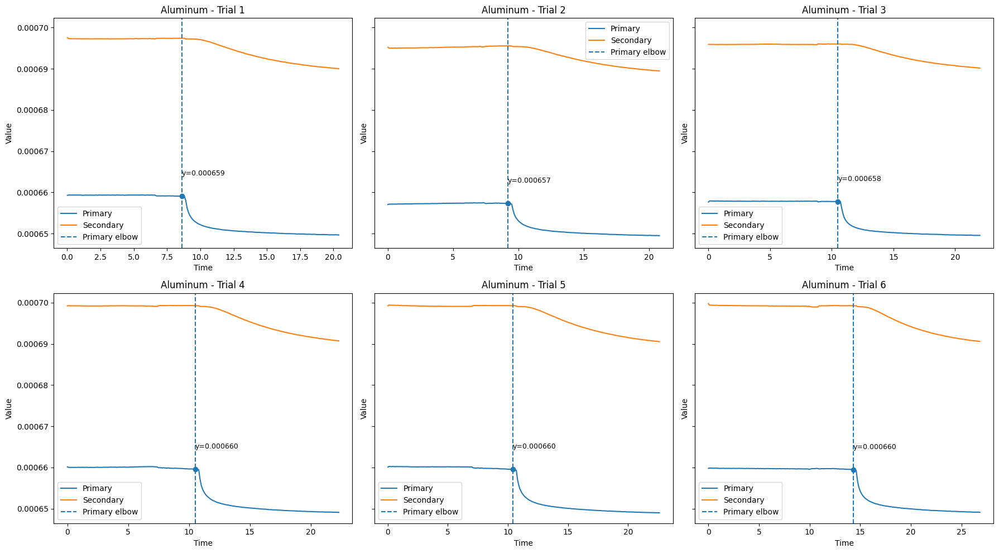

wood - Trial 1 - 147
wood - Trial 2 - 101
wood - Trial 3 - 96
wood - Trial 4 - 104
wood - Trial 5 - 115
wood - Trial 6 - 104


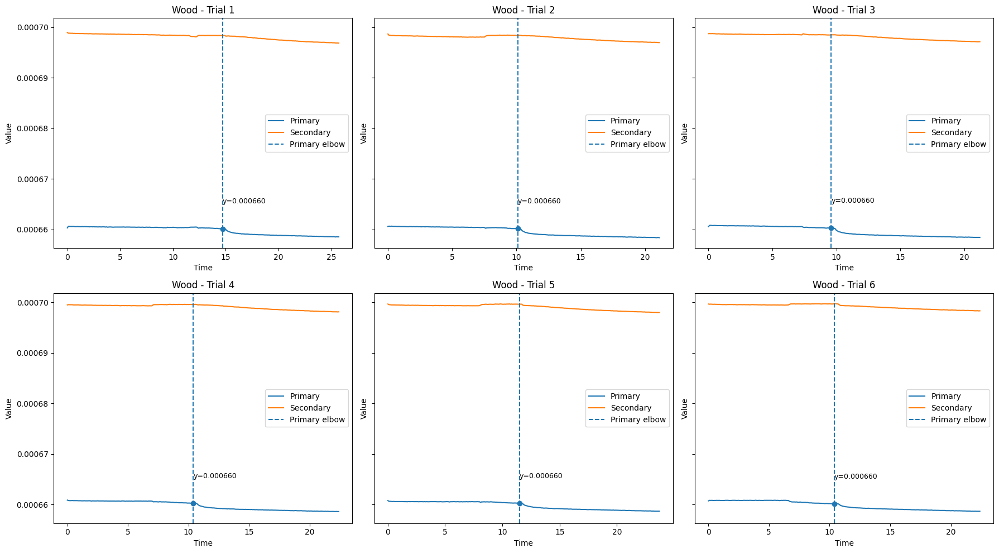

cork_fine - Trial 1 - 98
cork_fine - Trial 2 - 122
cork_fine - Trial 3 - 95
cork_fine - Trial 4 - 114
cork_fine - Trial 5 - 110
cork_fine - Trial 6 - 73


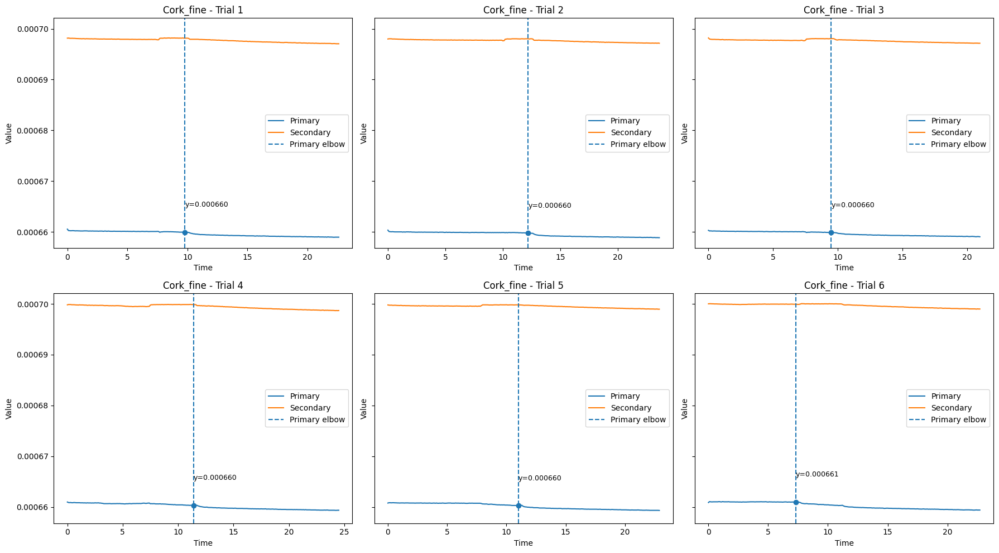

nickel - Trial 1 - 161
nickel - Trial 2 - 99
nickel - Trial 3 - 101
nickel - Trial 4 - 112
nickel - Trial 5 - 105
nickel - Trial 6 - 98


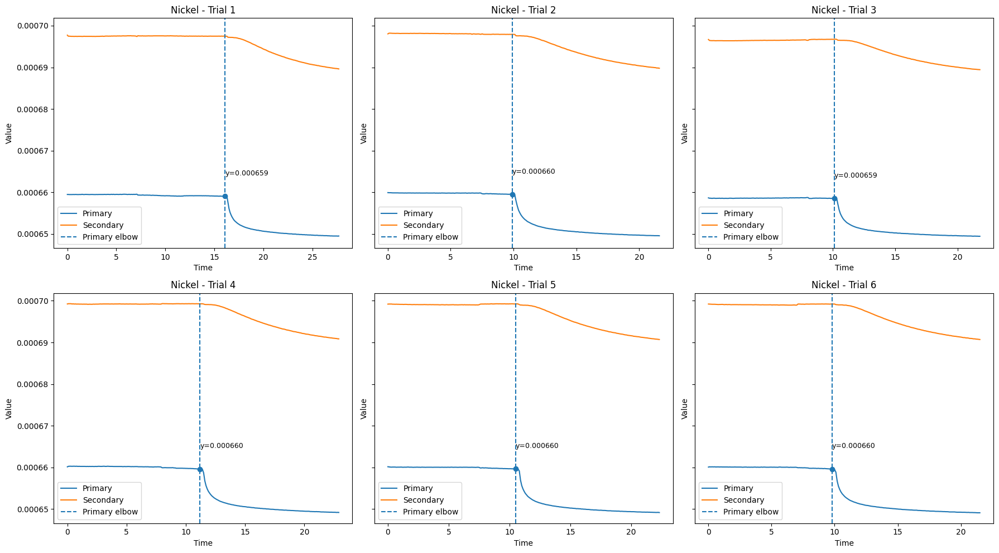

titanium - Trial 1 - 84
titanium - Trial 2 - 87
titanium - Trial 3 - 95
titanium - Trial 4 - 118
titanium - Trial 5 - 108
titanium - Trial 6 - 106


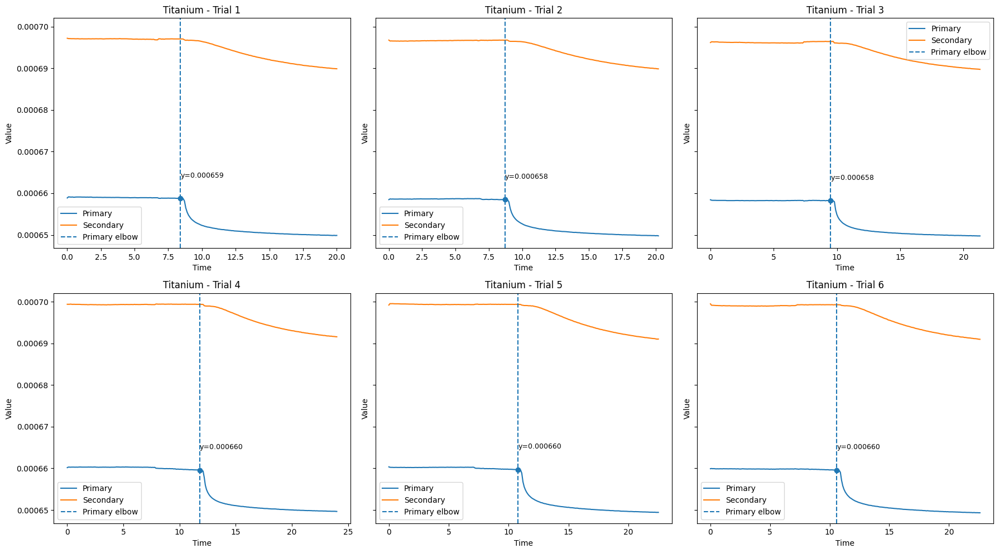

gypsum - Trial 1 - 113
gypsum - Trial 2 - 107
gypsum - Trial 3 - 101
gypsum - Trial 4 - 104
gypsum - Trial 5 - 107
gypsum - Trial 6 - 109


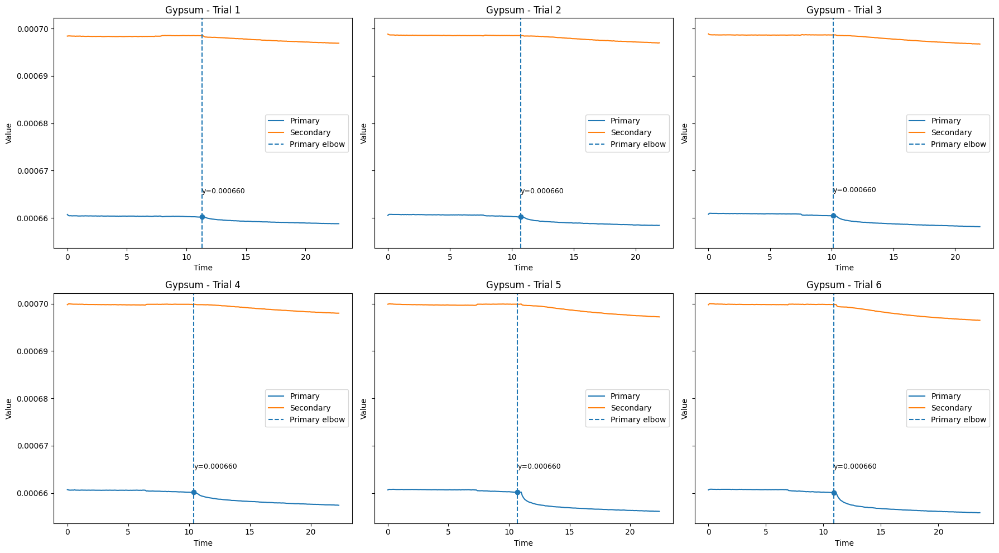

bismuth - Trial 1 - 100
bismuth - Trial 2 - 97
bismuth - Trial 3 - 93
bismuth - Trial 4 - 113
bismuth - Trial 5 - 117
bismuth - Trial 6 - 108


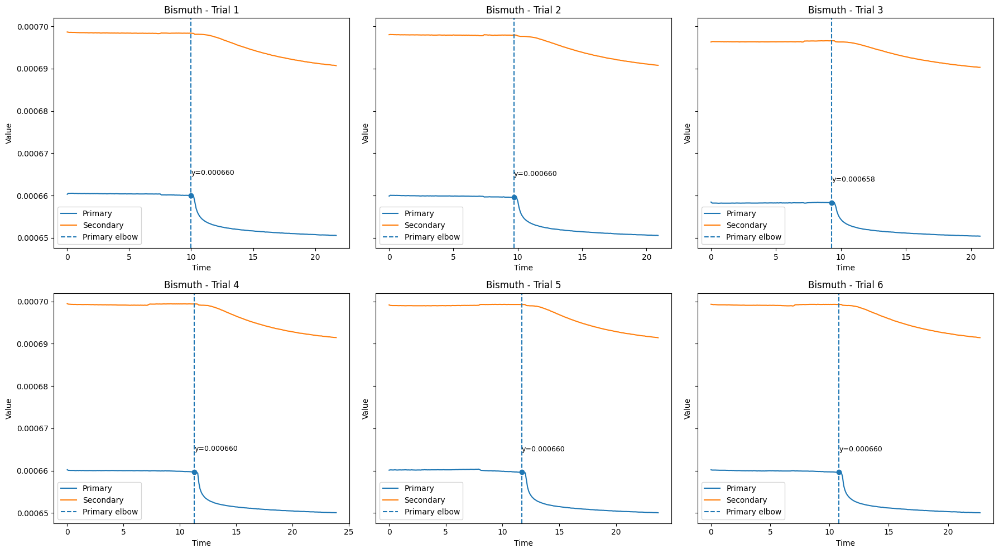

pdms - Trial 1 - 106
pdms - Trial 2 - 93
pdms - Trial 3 - 85
pdms - Trial 4 - 239
pdms - Trial 5 - 111
pdms - Trial 6 - 177


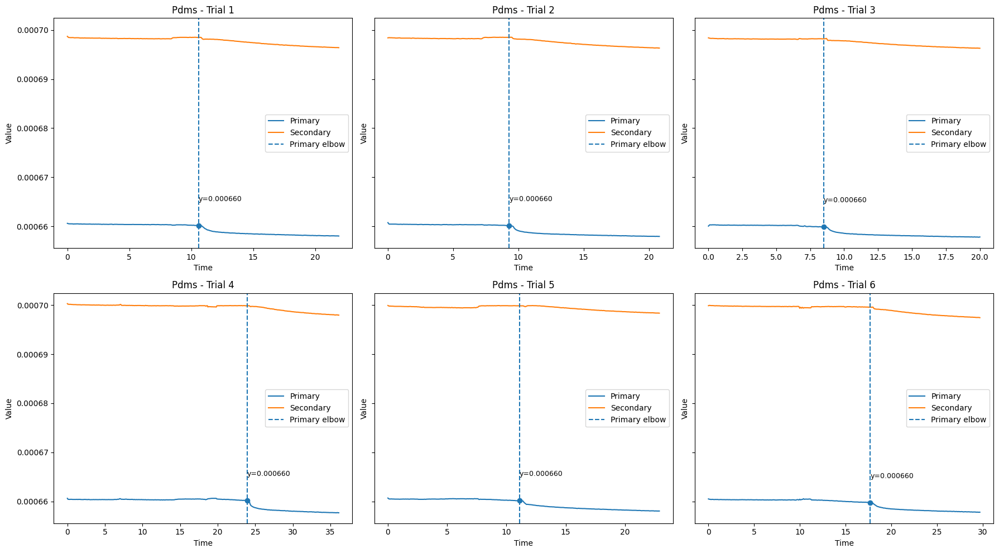

iron - Trial 1 - 101
iron - Trial 2 - 102
iron - Trial 3 - 83
iron - Trial 4 - 106
iron - Trial 5 - 102
iron - Trial 6 - 106


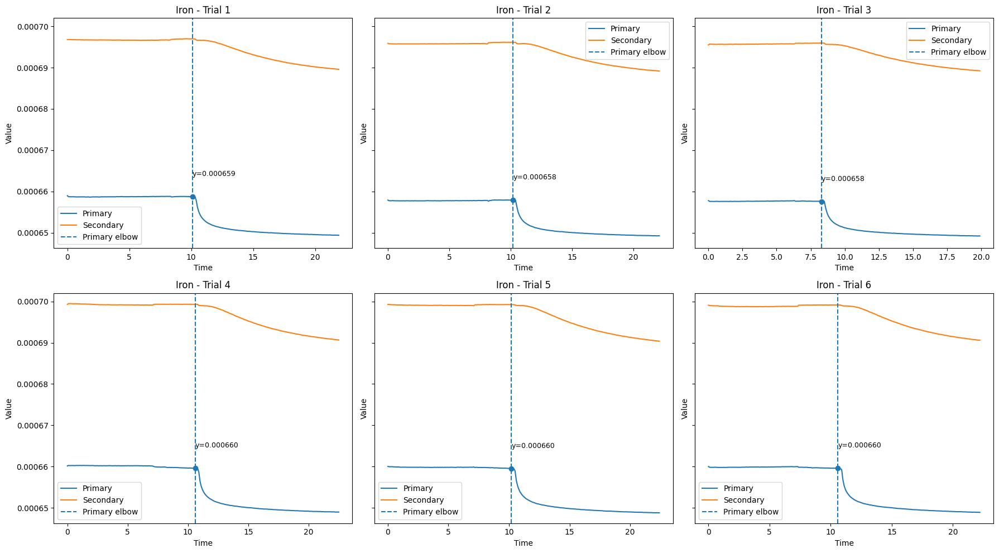

cement - Trial 1 - 95
cement - Trial 2 - 100
cement - Trial 3 - 103
cement - Trial 4 - 106
cement - Trial 5 - 119
cement - Trial 6 - 124


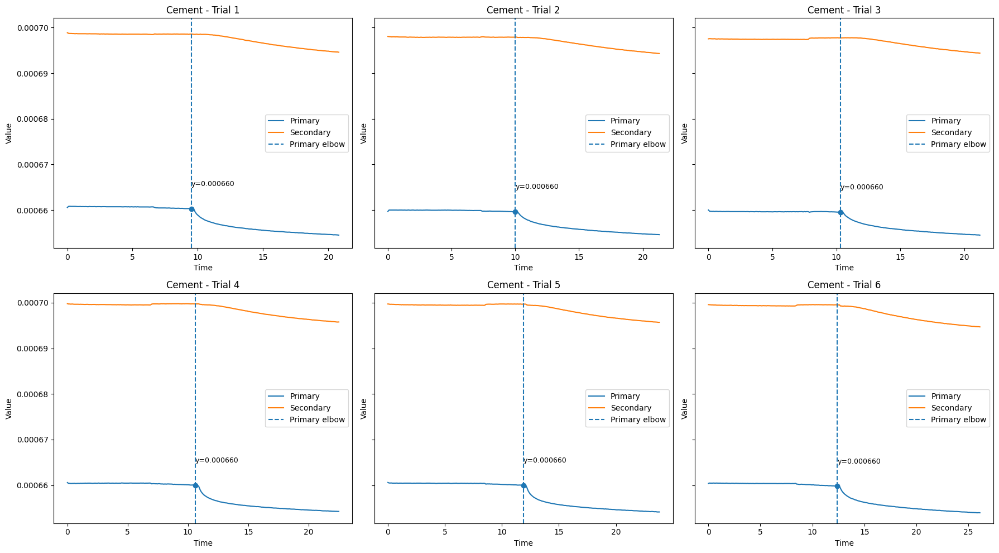

pu_foam - Trial 1 - 101
pu_foam - Trial 2 - 105
pu_foam - Trial 3 - 149
pu_foam - Trial 4 - 122
pu_foam - Trial 5 - 80
pu_foam - Trial 6 - 98


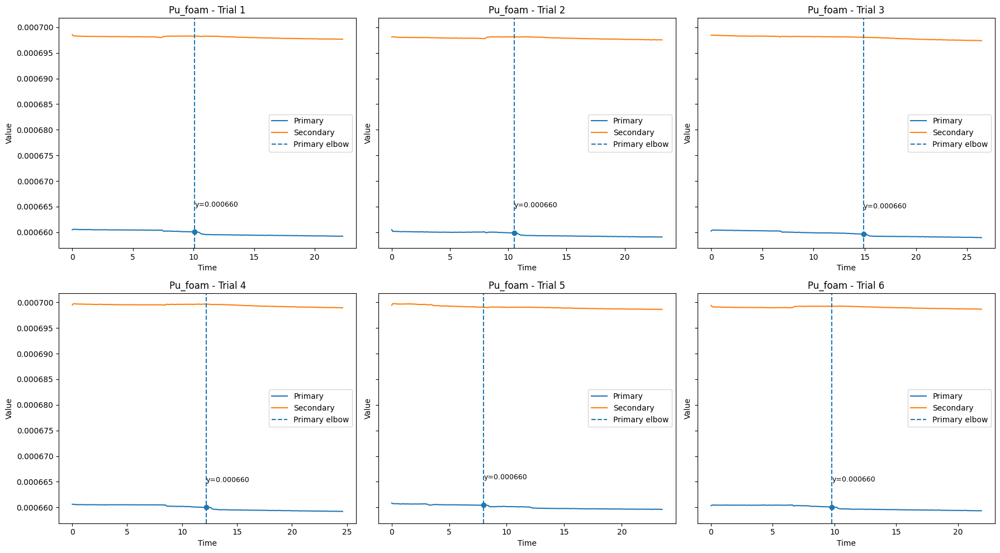

copper - Trial 1 - 101
copper - Trial 2 - 87
copper - Trial 3 - 92
copper - Trial 4 - 100
copper - Trial 5 - 109
copper - Trial 6 - 100


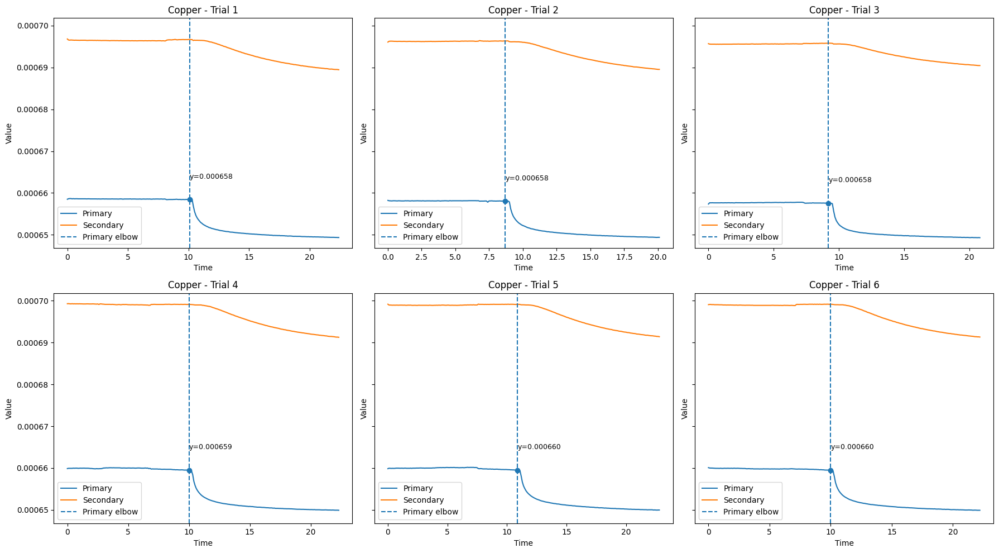

In [226]:
# For manual movement of elbow_idx
# Example:
# elbow_loc["pu_foam"][2] = 105

for m, elbows in elbow_loc.items():

    n_trials = len(elbows)
    n_cols = 3
    n_rows = math.ceil(n_trials / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5 * n_rows),
        sharey=True,
        squeeze=False
    )

    axes = axes.ravel()

    for plot_idx, (trial, elbow_idx) in enumerate(sorted(elbows.items())):

        ax = axes[plot_idx]

        subset = data[
            (data["Sample"] == m)
            & (data["Trial"].astype(int) == int(trial))
        ].copy()

        subset = subset.sort_values("Time")

        if subset.empty:
            ax.axis("off")
            print(f"No data: {m} - Trial {trial}")
            continue

        elbow_row = subset[
            subset["index"] == elbow_idx
        ]

        if elbow_row.empty:
            ax.axis("off")
            print(
                f"Elbow index not found: "
                f"{m} - Trial {trial} - {elbow_idx}"
            )
            continue

        elbow_time = elbow_row["Time"].iloc[0]
        elbow_value = elbow_row["Primary"].iloc[0]

        print(f"{m} - Trial {trial} - {elbow_idx}")

        ax.plot(
            subset["Time"].values,
            subset["Primary"].values,
            label="Primary"
        )

        ax.plot(
            subset["Time"].values,
            subset["Secondary"].values,
            label="Secondary"
        )

        if not np.isnan(elbow_time):

            ax.axvline(
                elbow_time,
                linestyle="--",
                label="Primary elbow"
            )

            ax.scatter(
                elbow_time,
                elbow_value,
                zorder=5
            )

            ax.annotate(
                f"y={elbow_value:.6f}",
                xy=(elbow_time, elbow_value),
                xytext=(elbow_time, elbow_value + 0.000005),
                fontsize=9
            )

        ax.set_xlabel("Time")
        ax.set_ylabel("Value")
        ax.set_title(f"{m.capitalize()} - Trial {trial}")
        ax.legend()

    # Hide unused subplot spaces
    for ax in axes[n_trials:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [227]:
#for i in elbow_loc.keys():
#    for j in range(1,4):
#        if i in ['cork_fine']:
#            elbow_loc[i][j] = elbow_loc[i][j] + 4
#        elif i in ['copper', 'titanium', 'pdms', 'pu_foam', 'aluminum']:
#            elbow_loc[i][j] = elbow_loc[i][j] + 3
#        else:
#            elbow_loc[i][j] = elbow_loc[i][j] + 2

In [228]:
data["is_elbow"] = False
data["filter"] = False
    
for (sample, trial), subset in data.groupby(["Sample", "Trial"]):                                                                                           #Review for another day

    elbow_idx = elbow_loc[sample][trial]                                                      #subtract here
    elbow_time = subset.loc[subset['index'] == elbow_idx, 'Time'].values[0]
    elbow_value = subset.loc[subset['index'] == elbow_idx, 'Primary'].values[0]

    #print(f"{sample} - Trial {trial} - {elbow_idx}")

    data.loc[(data['Sample'] == sample) & (data['Trial'].astype(int) == int(trial)) & (data['index'] >= elbow_idx), 'filter'] = True
    data.loc[(data['Sample'] == sample) & (data['Trial'].astype(int) == int(trial)) & (data['index'] >= elbow_idx), 'elbow_time'] = elbow_time
    data.loc[(data['Sample'] == sample) & (data['Trial'].astype(int) == int(trial)) & (data['index'] >= elbow_idx), 'elbow_idx'] = elbow_idx

    if not np.isnan(elbow_time):
        # find the actual row in the original dataframe closest to the elbow time
        elbow_row_idx = subset["Time"].sub(elbow_time).abs().idxmin()                               #gets the last time-point

        data.loc[elbow_row_idx, "is_elbow"] = True
        data.loc[elbow_row_idx, "elbow_time"] = elbow_time
        data.loc[elbow_row_idx, "elbow_value"] = elbow_value

data = data[data['filter']]
data['Time'] = data['Time'] - data['elbow_time']
data['index'] = data['index'] - data['elbow_idx']
data = data[data['index'] < 50]

In [229]:
data['Shift'] = None
for (label, trial), subset in data.groupby(['Label', 'Trial']):
    max_start = subset[(subset['Label'] == label) &  (subset['Trial'] == trial) & (data['index'] == 0)]['Primary'].max()
    for material, subset2 in subset.groupby('Sample'):
        start = subset2[subset2['index'] == 0]['Primary'].max()
        shift = max_start - start
        data.loc[(data['Sample'] == material) & (data['Trial'] == trial), "Shift"] = shift
data['Primary_shifted'] = data['Primary'] + data['Shift']

/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_3267/3271873353.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  max_start = subset[(subset['Label'] == label) &  (subset['Trial'] == trial) & (data['index'] == 0)]['Primary'].max()
/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_3267/3271873353.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  max_start = subset[(subset['Label'] == label) &  (subset['Trial'] == trial) & (data['index'] == 0)]['Primary'].max()
/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_3267/3271873353.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  max_start = subset[(subset['Label'] == label) &  (subset['Trial'] == trial) & (data['index'] == 0)]['Primary'].max()
/var/folders/fx/p7h99klx61g3f9j63ld4_xcm0000gn/T/ipykernel_3267/3271873353.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  max_start = s

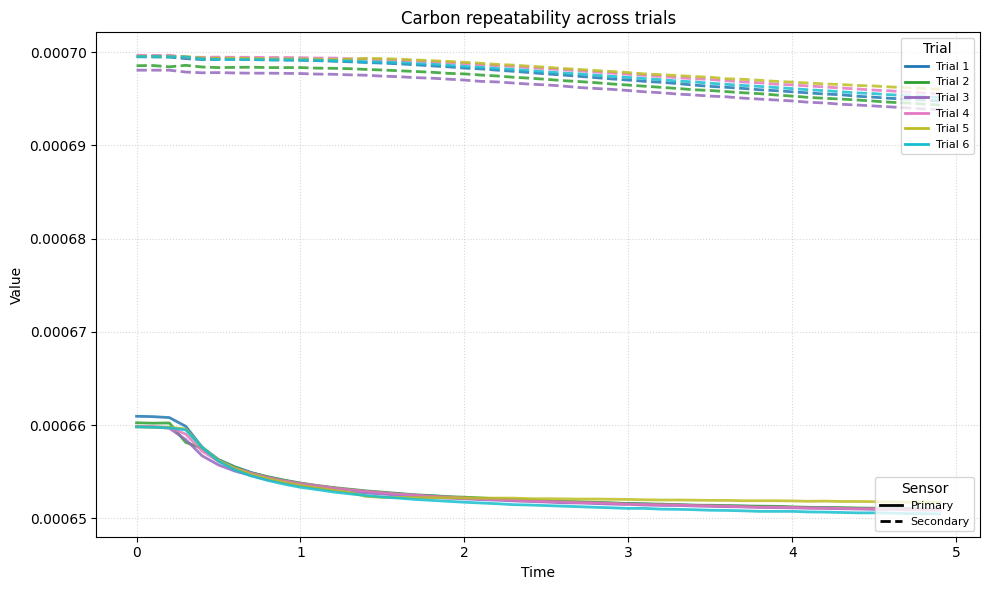

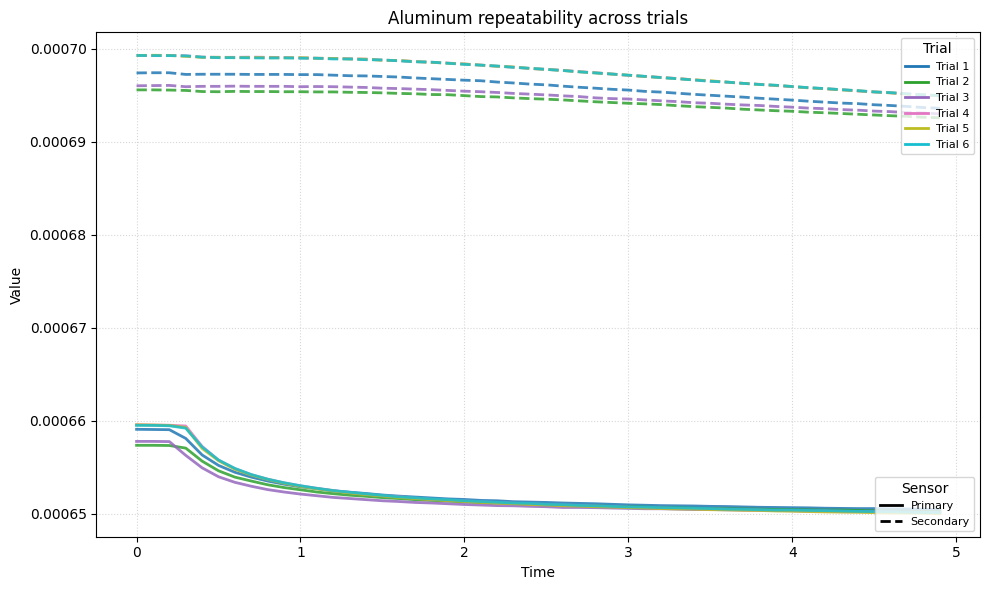

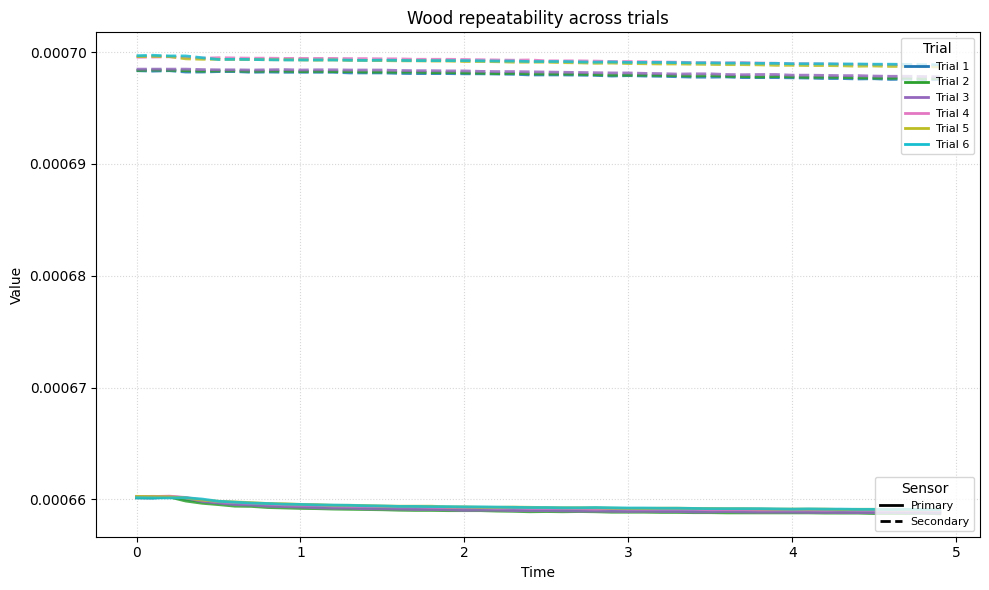

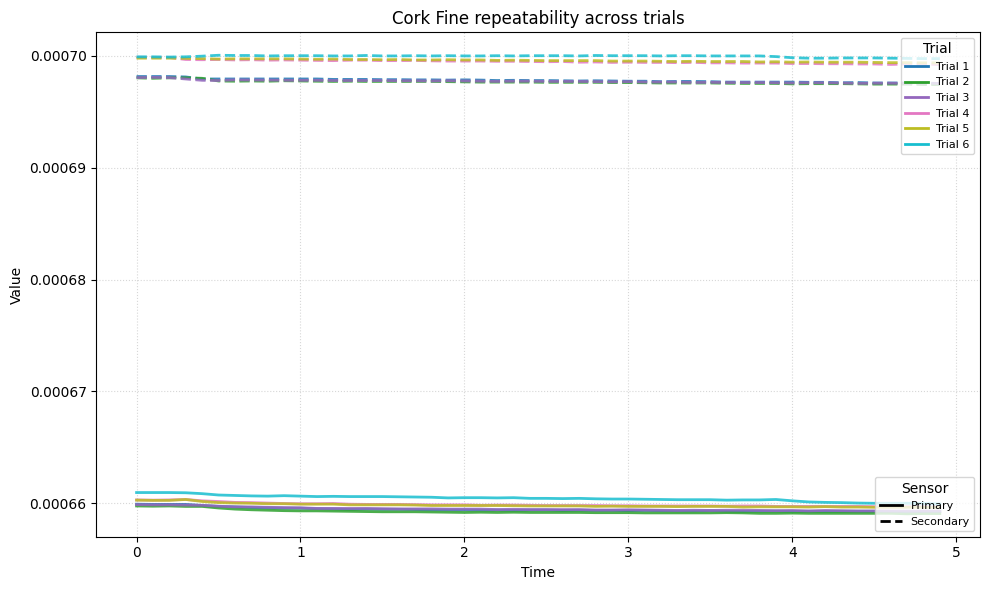

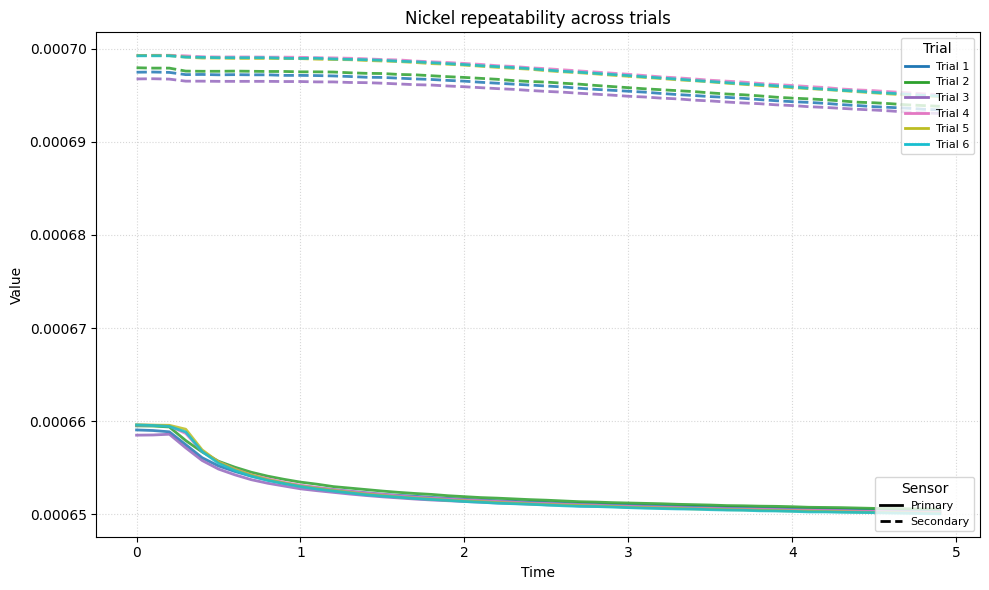

...

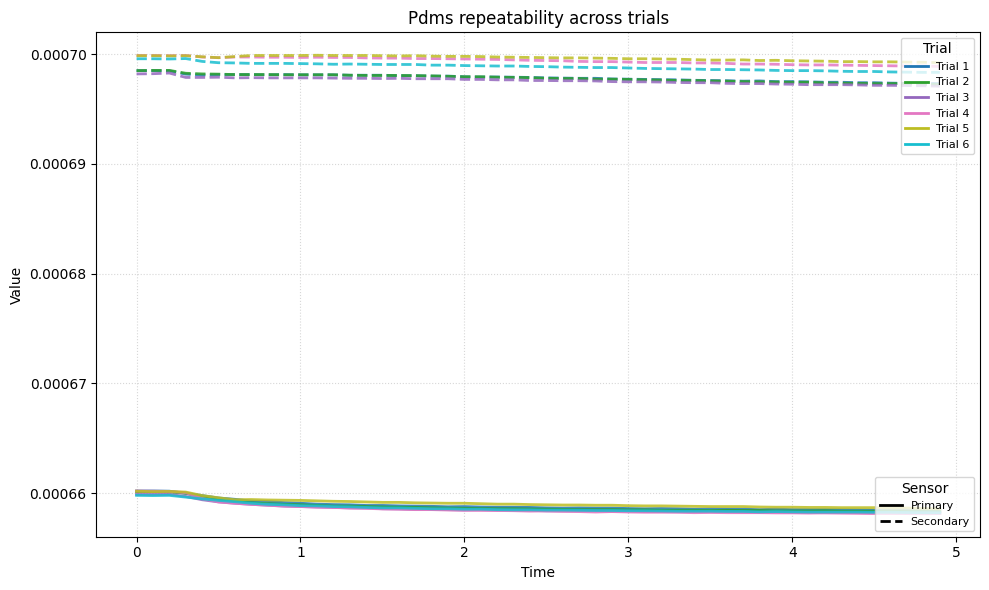

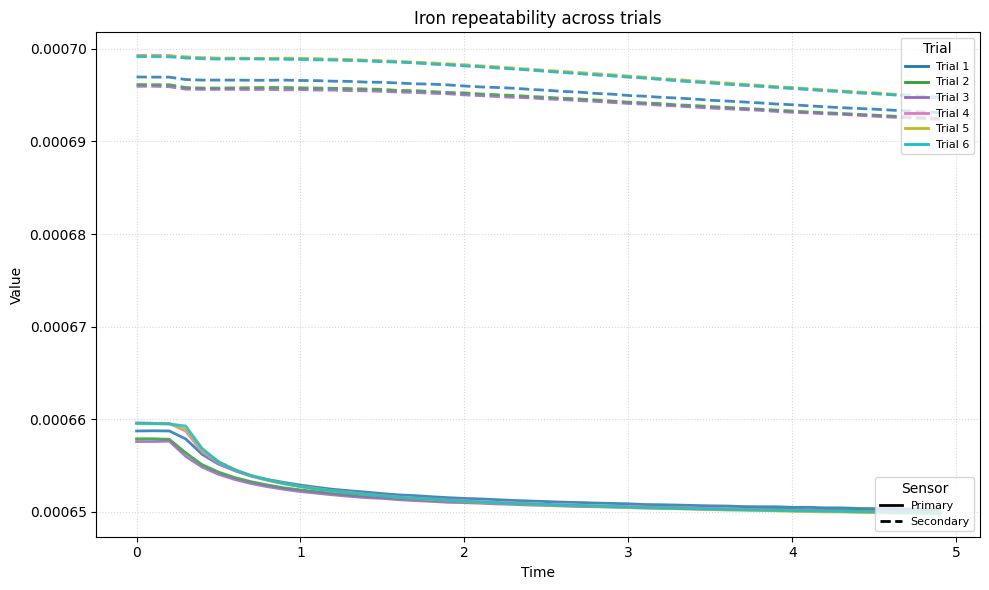

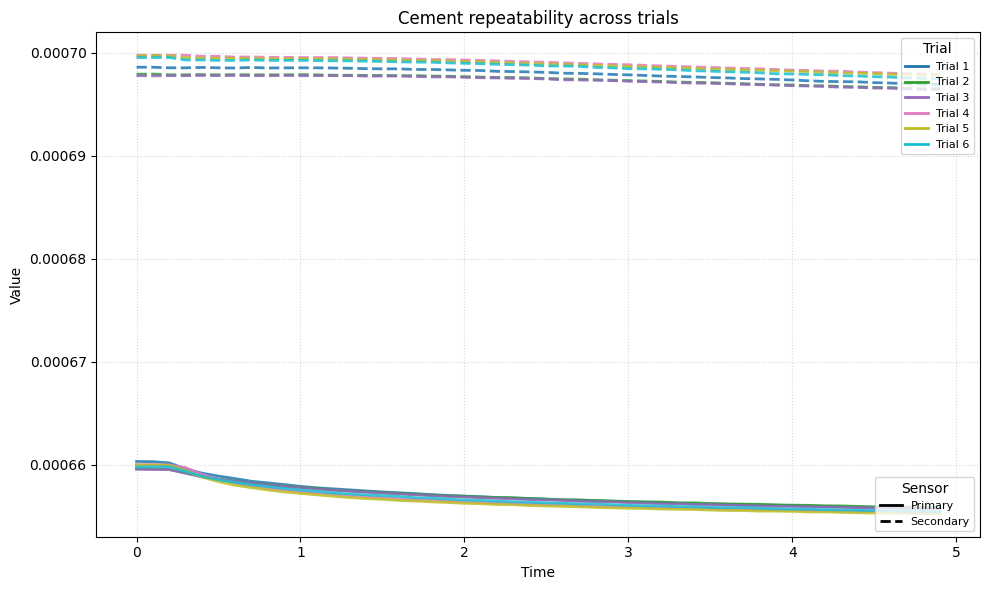

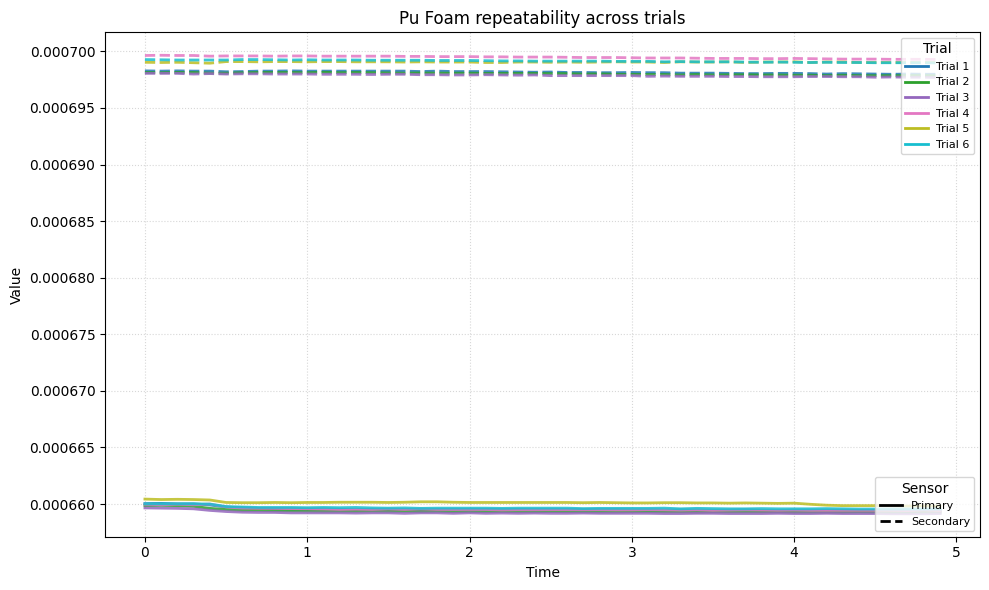

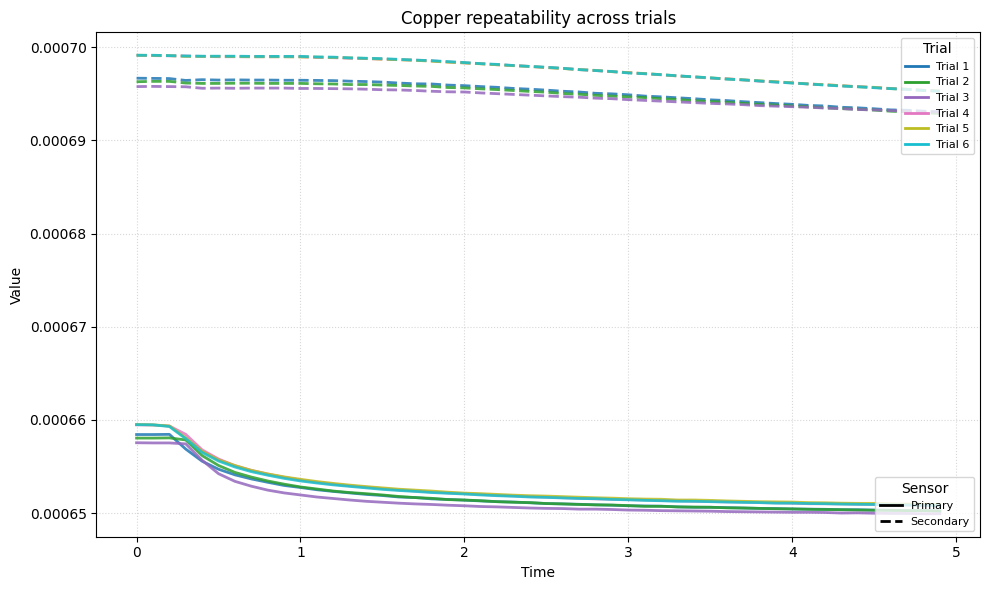

In [230]:
materials = [
    "carbon",
    "aluminum",
    "wood",
    "cork_fine",
    "nickel",
    "titanium",
    "gypsum",
    "bismuth",
    "pdms",
    "iron",
    "cement",
    "pu_foam",
    "copper",
]

for material in materials:

    material_data = (
        data[data["Sample"] == material]
        .sort_values(["Trial", "Time"])
        .copy()
    )

    if material_data.empty:
        print(f"No data found for {material}")
        continue

    trials = sorted(
        material_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    fig, ax = plt.subplots(figsize=(10, 6))

    cmap = plt.get_cmap("tab10", len(trials))

    for trial_idx, trial_no in enumerate(trials):

        subset = (
            material_data[
                material_data["Trial"].astype(int) == trial_no
            ]
            .sort_values("Time")
            .copy()
        )

        if subset.empty:
            continue

        trial_color = cmap(trial_idx)

        # Primary: solid line
        ax.plot(
            subset["Time"].values,
            subset["Primary"].values,
            color=trial_color,
            linestyle="-",
            linewidth=2,
            alpha=0.85,
        )

        # Secondary: dashed line
        ax.plot(
            subset["Time"].values,
            subset["Secondary"].values,
            color=trial_color,
            linestyle="--",
            linewidth=2,
            alpha=0.85,
        )

    # Legend for trial colors
    trial_handles = [
        Line2D(
            [0],
            [0],
            color=cmap(i),
            linestyle="-",
            linewidth=2,
            label=f"Trial {trial_no}",
        )
        for i, trial_no in enumerate(trials)
    ]

    # Legend for sensor line styles
    sensor_handles = [
        Line2D(
            [0],
            [0],
            color="black",
            linestyle="-",
            linewidth=2,
            label="Primary",
        ),
        Line2D(
            [0],
            [0],
            color="black",
            linestyle="--",
            linewidth=2,
            label="Secondary",
        ),
    ]

    legend1 = ax.legend(
        handles=trial_handles,
        title="Trial",
        loc="upper right",
        fontsize=8,
    )

    ax.add_artist(legend1)

    ax.legend(
        handles=sensor_handles,
        title="Sensor",
        loc="lower right",
        fontsize=8,
    )

    ax.set_xlabel("Time")
    ax.set_ylabel("Value")
    ax.set_title(
        f"{material.replace('_', ' ').title()} repeatability across trials"
    )

    ax.grid(
        linestyle=":",
        alpha=0.5,
    )

    plt.tight_layout()
    plt.show()

ceramic


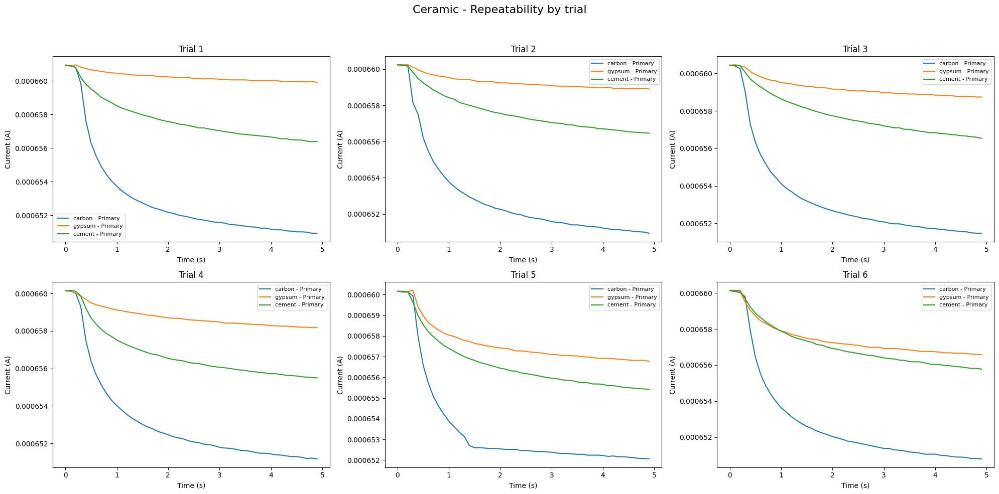

metal


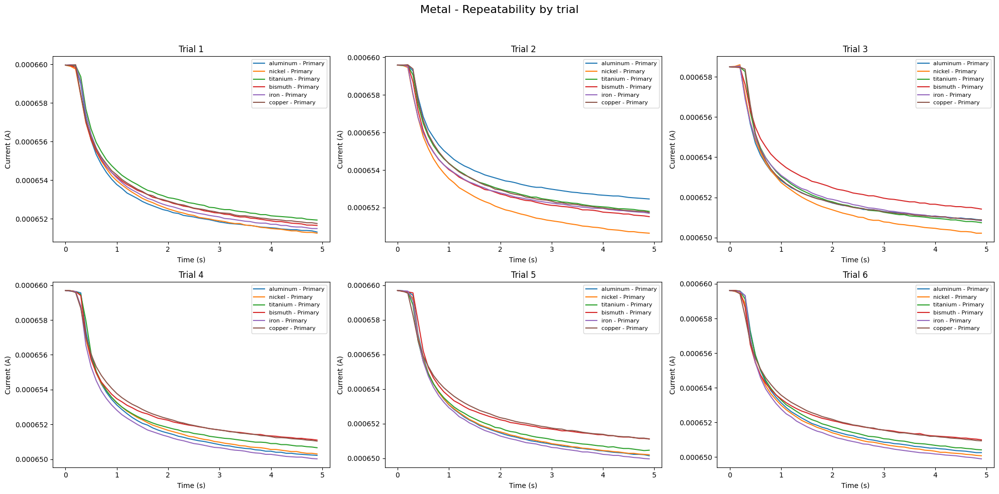

composite


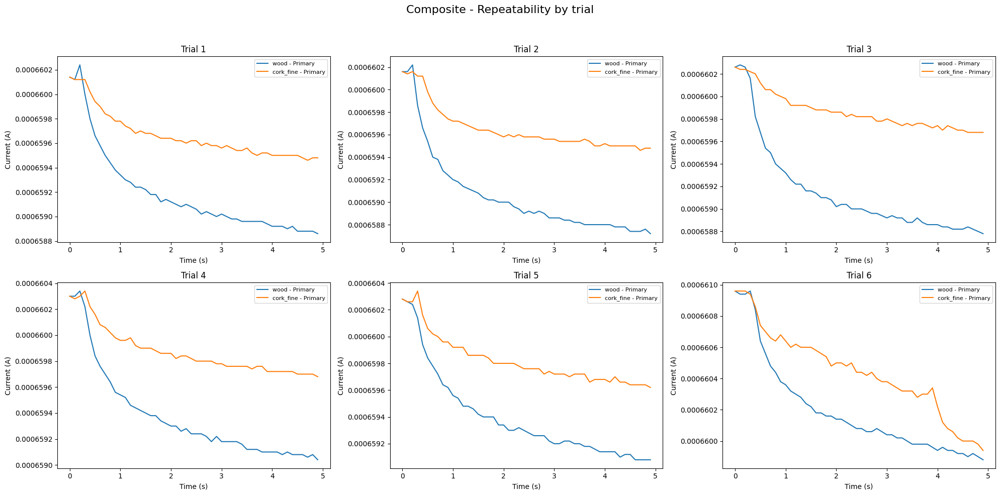

polymer


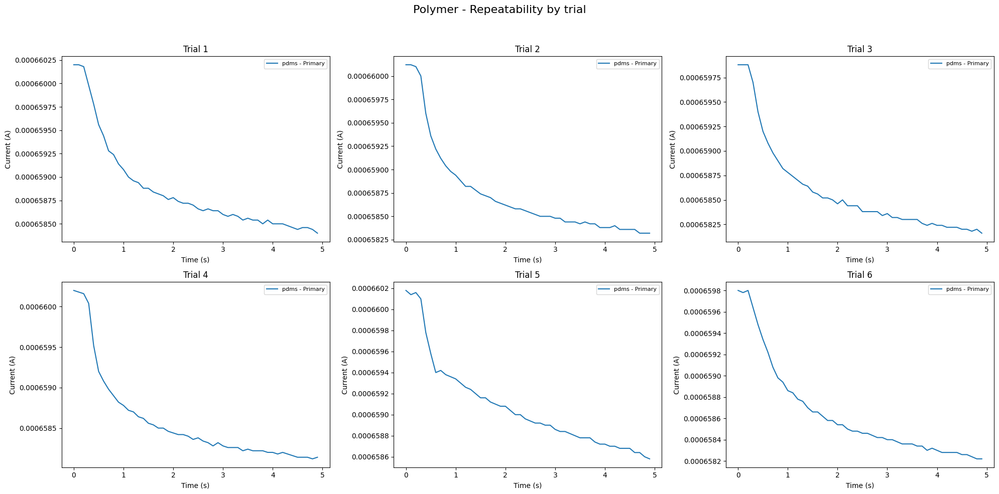

foam


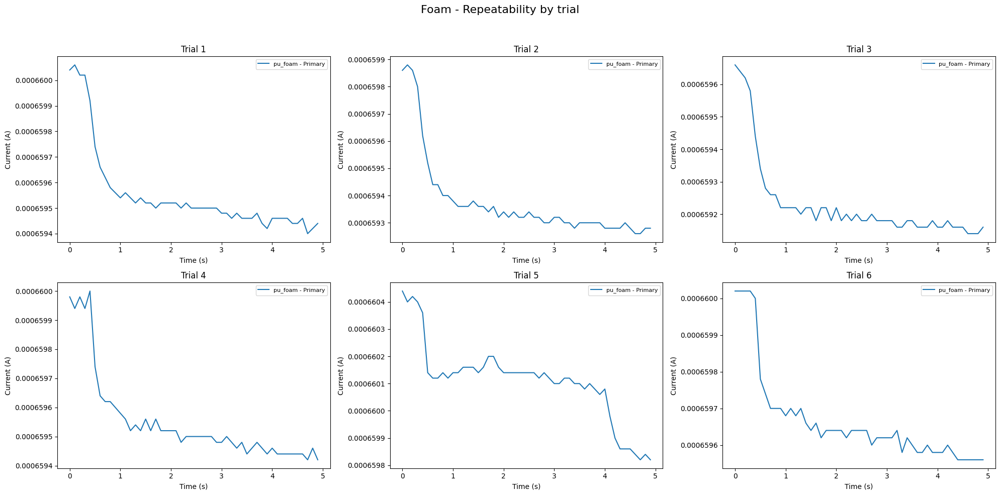

In [232]:
for label in data["Label"].unique().tolist():

    label_data = data[data["Label"] == label].copy()
    materials = label_data["Sample"].unique().tolist()

    trials = sorted(
        label_data["Trial"]
        .dropna()
        .astype(int)
        .unique()
    )

    n_cols = 3
    n_rows = math.ceil(len(trials) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(20, 5 * n_rows),
        squeeze=False
    )

    axes = axes.ravel()

    print(label)

    for ax, trial_no in zip(axes, trials):

        for material in materials:

            subset = data[
                (data["Sample"] == material)
                & (data["Trial"].astype(int) == trial_no)
            ].sort_values("Time")

            if subset.empty:
                continue

            ax.plot(
                subset["Time"].values,
                subset["Primary_shifted"].values,
                label=f"{material} - Primary"
            )

            # Optional Secondary
            # ax.plot(
            #     subset["Time"].values,
            #     subset["Secondary"].values,
            #     label=f"{material} - Secondary",
            #     linestyle="--"
            # )

        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Current (A)")
        ax.set_title(f"Trial {trial_no}")
        ax.legend(fontsize=8)

    # Hide unused subplot spaces
    for ax in axes[len(trials):]:
        ax.axis("off")

    fig.suptitle(
        f"{str(label).replace('_', ' ').title()} - Repeatability by trial",
        fontsize=16
    )

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.close()

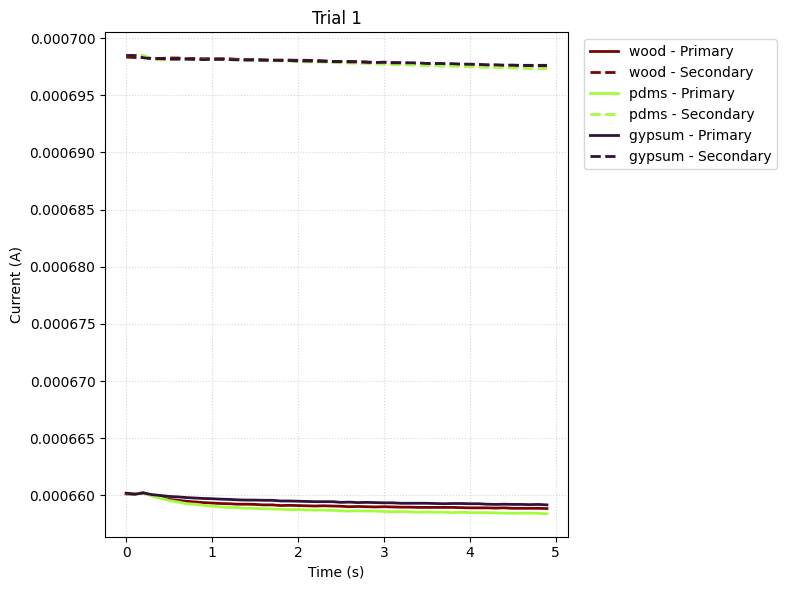

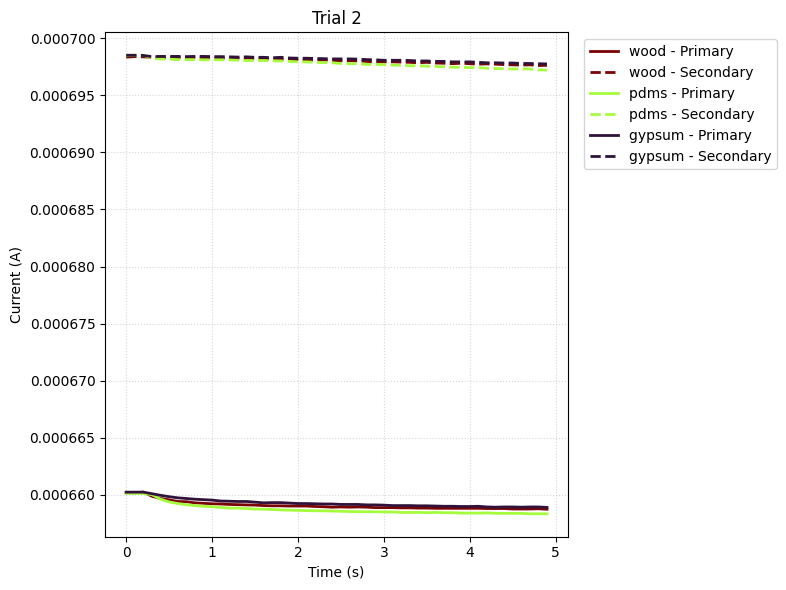

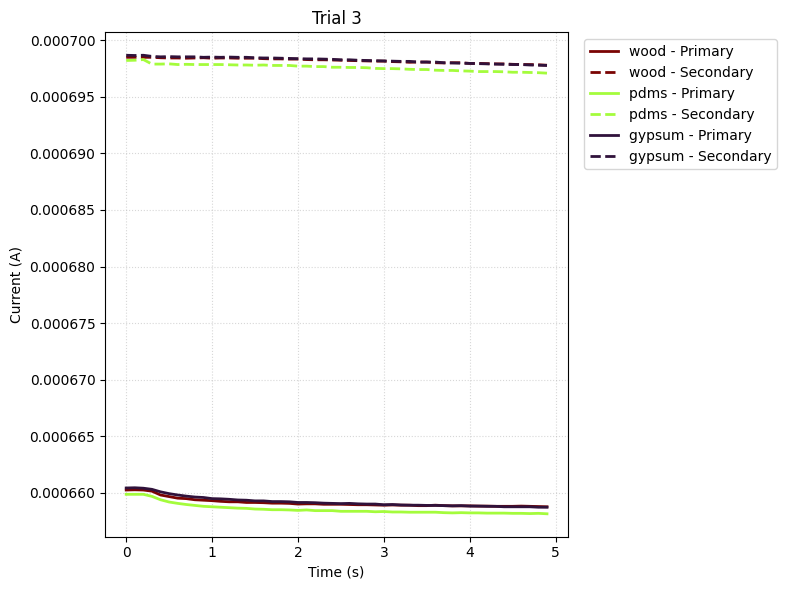

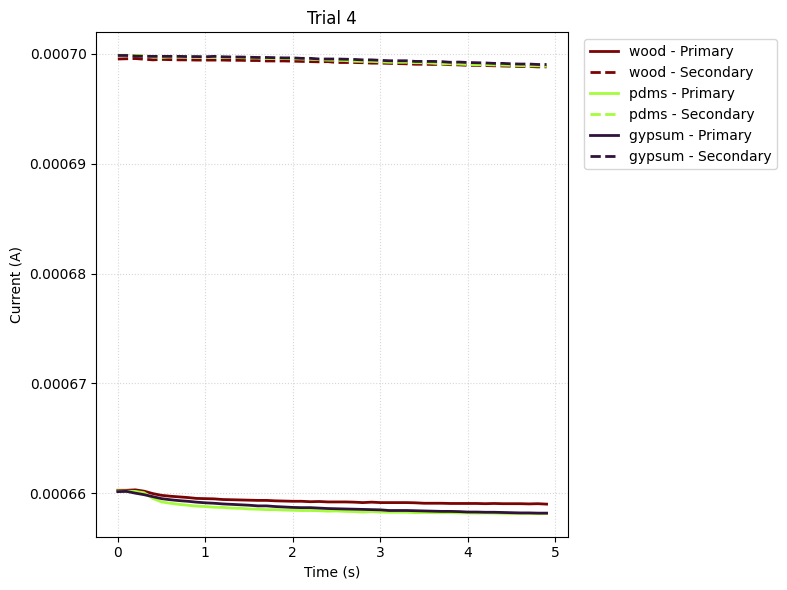

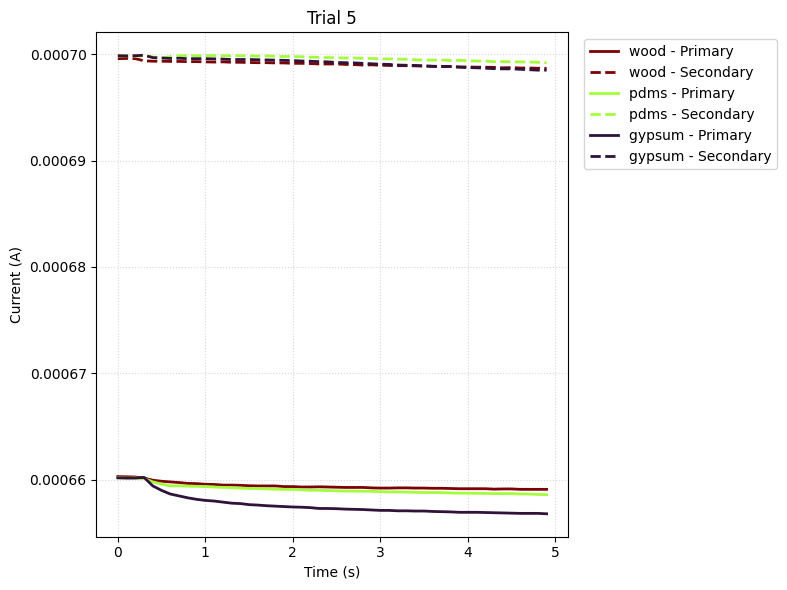

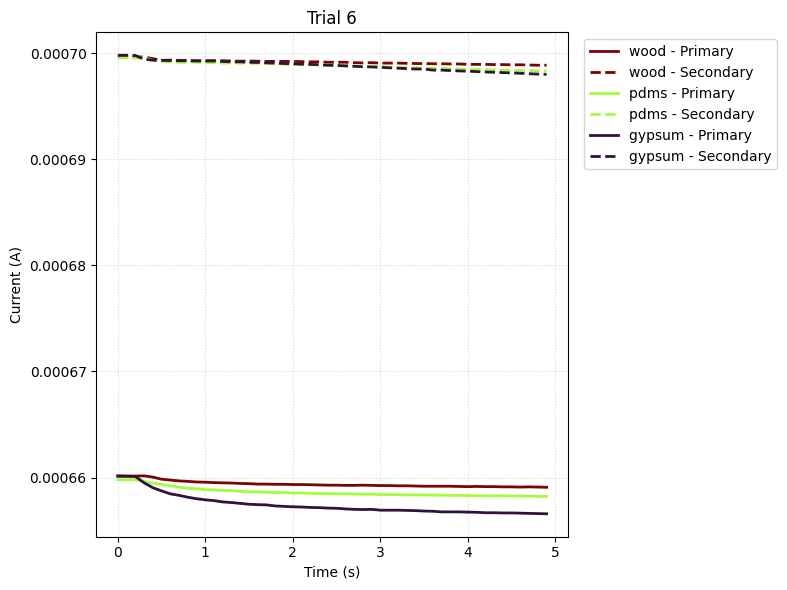

In [233]:
desired_order = [
    "wood",
    "pdms",
    "gypsum",
]

# Keep only materials that exist in the dataset
available_materials = data["Sample"].dropna().unique().tolist()

materials = [
    material
    for material in desired_order
    if material in available_materials
]

# Generate one color per material, then randomize the assignment
cmap = plt.get_cmap("turbo", len(materials))

colors = [
    cmap(index)
    for index in range(len(materials))
]

rng = np.random.default_rng(42)
rng.shuffle(colors)

material_colors = dict(zip(materials, colors))

# Create one figure per trial
for trial in sorted(data["Trial"].dropna().unique()):

    fig, ax = plt.subplots(figsize=(8, 6))

    for material in materials:

        subset = data[
            (data["Sample"] == material)
            & (data["Trial"] == trial)
        ].sort_values("Time")

        if subset.empty:
            continue

        color = material_colors[material]

        ax.plot(
            subset["Time"],
            subset["Primary"],
            color=color,
            linestyle="-",
            linewidth=2,
            label=f"{material} - Primary",
        )

        ax.plot(
            subset["Time"],
            subset["Secondary"],
            color=color,
            linestyle="--",
            linewidth=2,
            label=f"{material} - Secondary",
        )

    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Current (A)")
    ax.set_title(f"Trial {trial}")

    ax.grid(
        linestyle=":",
        alpha=0.5,
    )

    ax.legend(
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
    )

    plt.tight_layout()
    plt.show()
    plt.close()

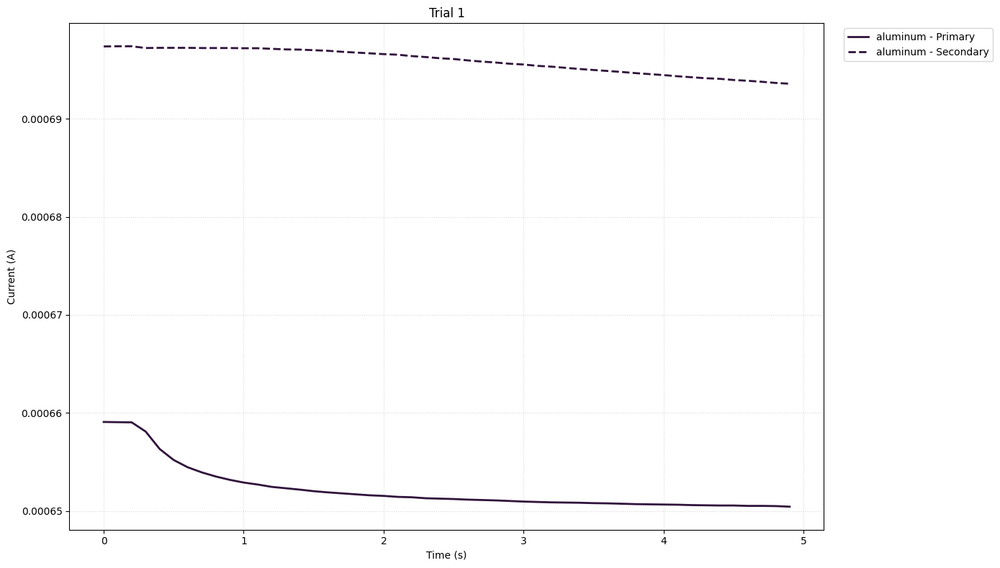

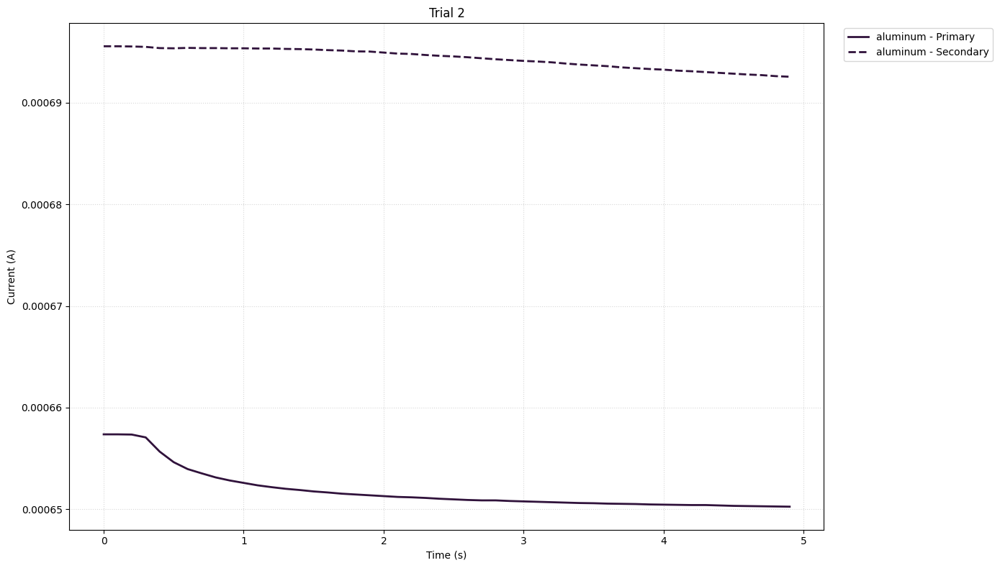

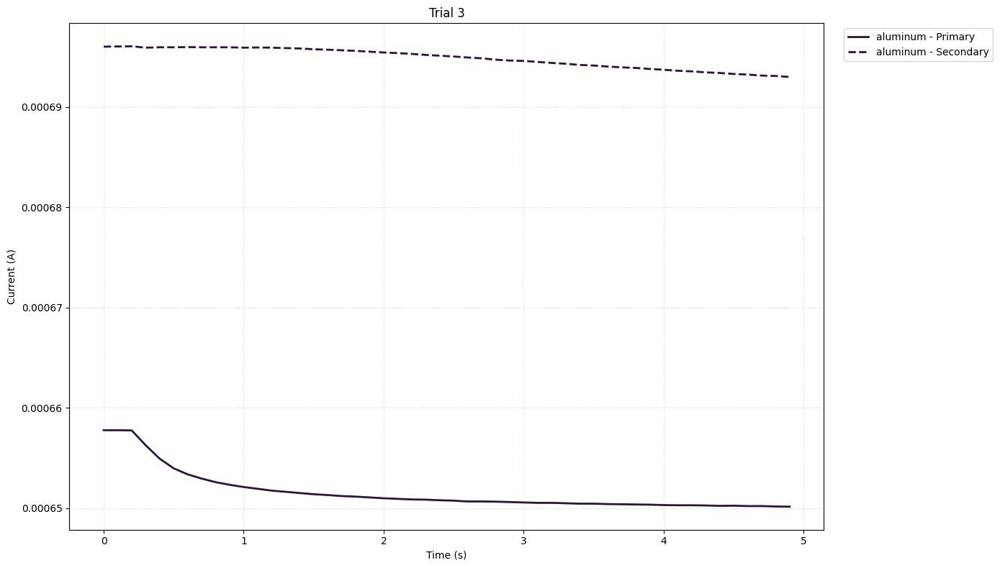

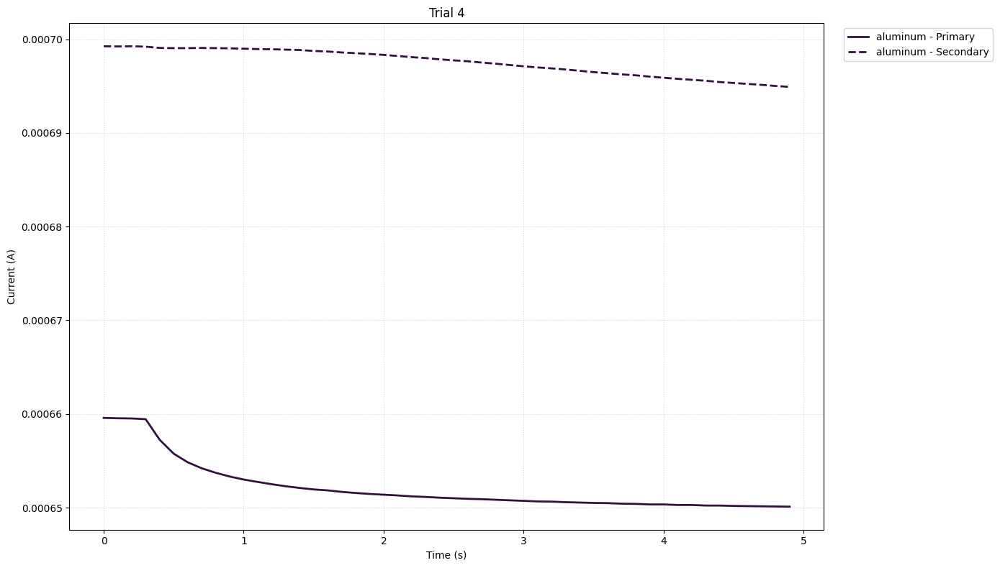

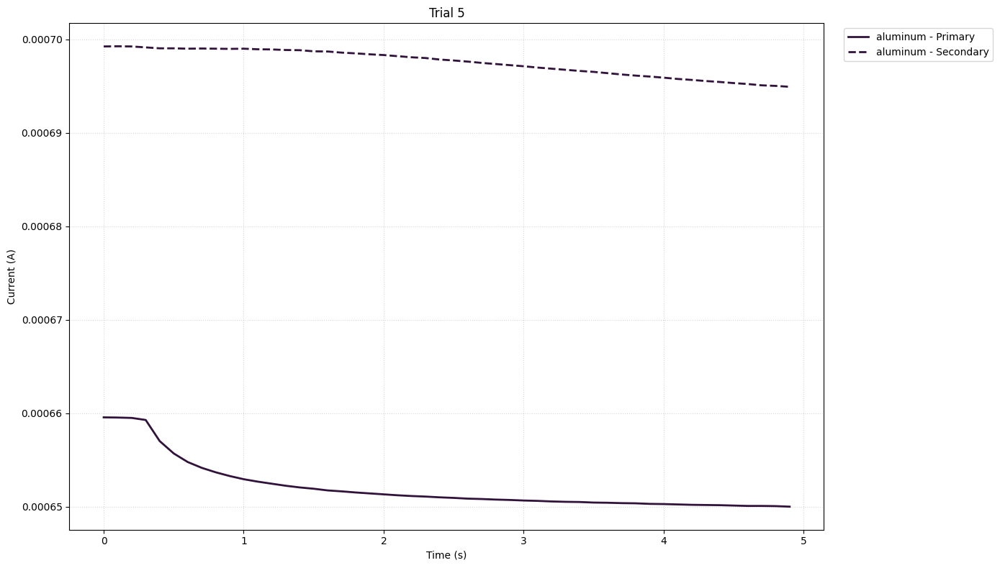

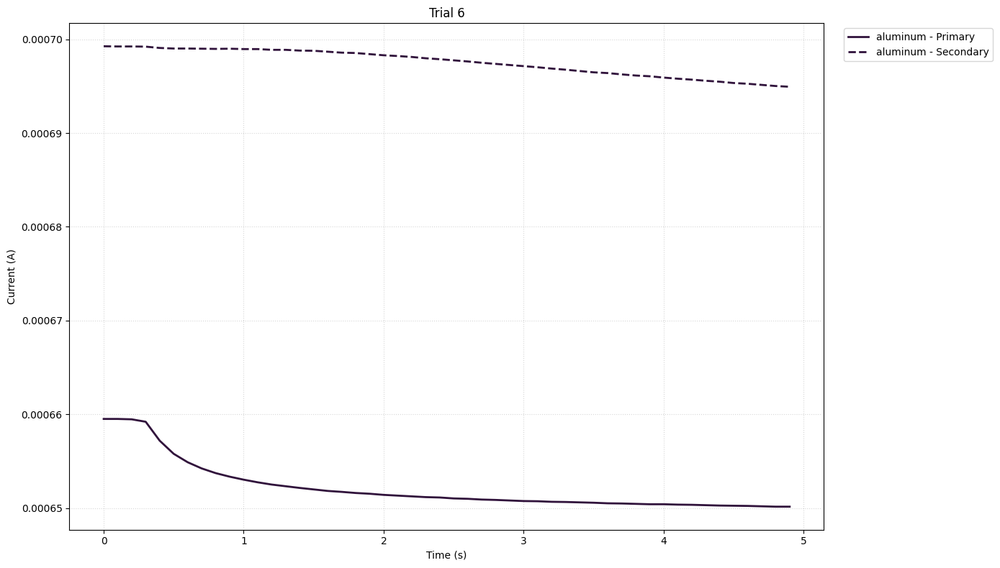

In [161]:
desired_order = [
    "copper",
    "aluminum",
    "iron",
    "nickel",
    "titanium",
    "bismuth",
    "carbon",
    "cement",
    "gypsum",
    "pdms",
    "ps_foam",
    "pu_foam",
    "cork_coarse",
    "cork_fine",
    "abrasive",
    "wood",
]

# Keep only materials that actually exist in the data
available_materials = data["Sample"].dropna().unique().tolist()

materials = [
    material
    for material in desired_order
    if material in available_materials
]

# Generate colors, then randomize their assignment
cmap = plt.get_cmap("turbo", len(materials))

colors = [
    cmap(idx)
    for idx in range(len(materials))
]

# Fixed seed gives the same random colors every time
rng = np.random.default_rng(42)
rng.shuffle(colors)

material_colors = dict(
    zip(materials, colors)
)

# One figure per trial
for trial in sorted(data["Trial"].dropna().unique()):

    fig, ax = plt.subplots(figsize=(14, 8))

    for material in materials:

        subset = data[
            (data["Sample"] == material)
            & (data["Trial"] == trial)
        ].sort_values("Time")

        if subset.empty:
            continue

        color = material_colors[material]

        ax.plot(
            subset["Time"],
            subset["Primary"],
            color=color,
            linestyle="-",
            linewidth=2,
            label=f"{material} - Primary",
        )

        ax.plot(
            subset["Time"],
            subset["Secondary"],
            color=color,
            linestyle="--",
            linewidth=2,
            label=f"{material} - Secondary",
        )

    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Current (A)")
    ax.set_title(f"Trial {trial}")

    ax.grid(
        linestyle=":",
        alpha=0.5,
    )

    ax.legend(
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
    )

    plt.tight_layout()
    plt.show()
    plt.close()

# Manual Extraction (new)

In [234]:
#new
def extract_trial_features(
    trial_data,
    analysis_window=(0.0, 5.0),
    initial_window=(0.0, 1.0),
    early_window=(0.0, 1.0),
    mid_window=(1.0, 3.0),
    late_window=(3.0, 5.0),
    smooth=True,
    savgol_window=11,
    savgol_polyorder=2,
):
    """
    Extract temperature-response and derivative-based features
    from one trial.

    Assumptions
    -----------
    - Columns:
        Time
        Primary
        Secondary
    - The first row corresponds to detected contact onset/elbow.
    - Primary and Secondary are already temperature values, or are
      linearly proportional to temperature.
    - Time is expressed in seconds.

    Returns
    -------
    pd.Series
        One row containing all extracted features.
    """

    # ------------------------------------------------------------
    # Helper functions
    # ------------------------------------------------------------

    def make_mask(time_array, window):
        start, end = window
        return (time_array >= start) & (time_array <= end)

    def fitted_slope(time_array, signal_array, window):
        """
        Fit y = slope*x + intercept within the selected window.
        """
        mask = make_mask(time_array, window)

        valid = (
            mask
            & np.isfinite(time_array)
            & np.isfinite(signal_array)
        )

        if valid.sum() < 3:
            return np.nan

        slope, _ = np.polyfit(
            time_array[valid],
            signal_array[valid],
            deg=1,
        )

        return float(slope)

    def mean_rate(time_array, signal_array, window):
        """
        Mean dT/dt over a window.

        Equivalent to:
            [T(t2) - T(t1)] / [t2 - t1]
        """
        start, end = window

        if end <= start:
            return np.nan

        if start < time_array.min() or end > time_array.max():
            return np.nan

        start_value = np.interp(
            start,
            time_array,
            signal_array,
        )

        end_value = np.interp(
            end,
            time_array,
            signal_array,
        )

        return float(
            (end_value - start_value)
            / (end - start)
        )

    def safe_ratio(numerator, denominator):
        if (
            not np.isfinite(numerator)
            or not np.isfinite(denominator)
            or np.isclose(denominator, 0.0)
        ):
            return np.nan

        return float(numerator / denominator)

    def estimate_rate_lag(
        time_array,
        primary_rate,
        secondary_rate,
        window,
    ):
        """
        Estimate the lag between Primary and Secondary derivative
        profiles using normalized cross-correlation.

        Positive lag:
            Secondary response occurs after Primary response.
        """
        mask = make_mask(time_array, window)

        t = time_array[mask]
        x = primary_rate[mask]
        y = secondary_rate[mask]

        valid = (
            np.isfinite(t)
            & np.isfinite(x)
            & np.isfinite(y)
        )

        t = t[valid]
        x = x[valid]
        y = y[valid]

        if len(t) < 4:
            return np.nan

        # Resample onto a uniform time grid because cross-correlation
        # assumes equally spaced observations.
        dt = np.median(np.diff(t))

        if not np.isfinite(dt) or dt <= 0:
            return np.nan

        uniform_time = np.arange(
            t[0],
            t[-1] + 0.5 * dt,
            dt,
        )

        x_uniform = np.interp(
            uniform_time,
            t,
            x,
        )

        y_uniform = np.interp(
            uniform_time,
            t,
            y,
        )

        # Remove the means and normalize.
        x_uniform = x_uniform - np.mean(x_uniform)
        y_uniform = y_uniform - np.mean(y_uniform)

        x_std = np.std(x_uniform)
        y_std = np.std(y_uniform)

        if np.isclose(x_std, 0.0) or np.isclose(y_std, 0.0):
            return np.nan

        x_uniform = x_uniform / x_std
        y_uniform = y_uniform / y_std

        correlation = correlate(
            y_uniform,
            x_uniform,
            mode="full",
        )

        lags = correlation_lags(
            len(y_uniform),
            len(x_uniform),
            mode="full",
        )

        best_lag_samples = lags[
            np.argmax(correlation)
        ]

        return float(best_lag_samples * dt)

    # ------------------------------------------------------------
    # 1. Clean and sort the trial
    # ------------------------------------------------------------

    required_columns = {
        "Time",
        "Primary",
        "Secondary",
    }

    missing_columns = (
        required_columns
        - set(trial_data.columns)
    )

    if missing_columns:
        raise KeyError(
            f"Missing columns: {sorted(missing_columns)}"
        )

    trial_data = (
        trial_data[
            ["Time", "Primary", "Secondary"]
        ]
        .copy()
        .apply(pd.to_numeric, errors="coerce")
        .dropna()
        .sort_values("Time")
        .drop_duplicates(subset="Time")
        .reset_index(drop=True)
    )

    if len(trial_data) < 4:
        raise ValueError(
            "The trial contains too few valid observations."
        )

    original_time = trial_data[
        "Time"
    ].to_numpy(dtype=float)

    primary = trial_data[
        "Primary"
    ].to_numpy(dtype=float)

    secondary = trial_data[
        "Secondary"
    ].to_numpy(dtype=float)

    if np.any(np.diff(original_time) <= 0):
        raise ValueError(
            "Time must be strictly increasing."
        )

    # ------------------------------------------------------------
    # 2. Treat first observation as contact onset/elbow
    # ------------------------------------------------------------

    elbow_time = float(original_time[0])

    time = original_time - elbow_time

    # ------------------------------------------------------------
    # 3. Restrict every trial to the same fixed analysis window
    # ------------------------------------------------------------

    analysis_mask = make_mask(
        time,
        analysis_window,
    )

    time = time[analysis_mask]
    primary = primary[analysis_mask]
    secondary = secondary[analysis_mask]

    if len(time) < 4:
        raise ValueError(
            "Too few observations inside analysis_window."
        )

    # ------------------------------------------------------------
    # 4. Smooth the temperature signals before differentiation
    # ------------------------------------------------------------

    def smooth_signal(signal):
        if not smooth:
            return signal.copy()

        window = min(
            int(savgol_window),
            len(signal),
        )

        # Savitzky-Golay window must be odd.
        if window % 2 == 0:
            window -= 1

        minimum_window = savgol_polyorder + 2

        if minimum_window % 2 == 0:
            minimum_window += 1

        if window < minimum_window:
            return signal.copy()

        return savgol_filter(
            signal,
            window_length=window,
            polyorder=savgol_polyorder,
            mode="interp",
        )

    primary_smooth = smooth_signal(primary)
    secondary_smooth = smooth_signal(secondary)

    difference_smooth = (
        primary_smooth - secondary_smooth
    )

    # ------------------------------------------------------------
    # 5. Calculate full dT/dt profiles
    # ------------------------------------------------------------

    # np.gradient supports nonuniform time spacing.
    primary_rate = np.gradient(
        primary_smooth,
        time,
    )

    secondary_rate = np.gradient(
        secondary_smooth,
        time,
    )

    difference_rate = (
        primary_rate - secondary_rate
    )

    signals = {
        "primary": {
            "temperature": primary_smooth,
            "rate": primary_rate,
        },
        "secondary": {
            "temperature": secondary_smooth,
            "rate": secondary_rate,
        },
        "difference": {
            "temperature": difference_smooth,
            "rate": difference_rate,
        },
    }

    result = {
        "elbow_time": elbow_time,
        "analysis_start": analysis_window[0],
        "analysis_end": analysis_window[1],
    }

    # ------------------------------------------------------------
    # 6. Extract temperature and derivative features
    # ------------------------------------------------------------

    for name, values in signals.items():

        signal = values["temperature"]
        rate = values["rate"]

        baseline_value = float(signal[0])
        change = signal - baseline_value

        # --------------------------------------------------------
        # Temperature-response features
        # --------------------------------------------------------

        result[f"{name}_elbow_value"] = baseline_value

        # Since heating is sustained, use fixed-window endpoint
        # rather than "peak temperature."
        result[f"{name}_final_offset"] = float(
            change[-1]
        )

        result[f"{name}_response_auc"] = float(
            np.trapezoid(
                np.abs(change),
                time,
            )
        )

        # --------------------------------------------------------
        # Initial rate: fitted slope over initial_window
        # --------------------------------------------------------

        initial_rate = fitted_slope(
            time,
            signal,
            initial_window,
        )

        # Mean early rate:
        # [T(t2)-T(t1)] / [t2-t1]
        early_mean_rate = mean_rate(
            time,
            signal,
            early_window,
        )

        # Mid- and late-window fitted rates
        mid_rate = fitted_slope(
            time,
            signal,
            mid_window,
        )

        late_rate = fitted_slope(
            time,
            signal,
            late_window,
        )

        # --------------------------------------------------------
        # Maximum derivative and corresponding time
        # --------------------------------------------------------

        if np.all(np.isnan(rate)):
            max_rate = np.nan
            max_abs_rate = np.nan
            time_of_max_rate = np.nan
            time_of_max_abs_rate = np.nan

        else:
            max_rate_index = int(
                np.nanargmax(rate)
            )

            max_abs_rate_index = int(
                np.nanargmax(np.abs(rate))
            )

            max_rate = float(
                rate[max_rate_index]
            )

            max_abs_rate = float(
                np.abs(
                    rate[max_abs_rate_index]
                )
            )

            time_of_max_rate = float(
                time[max_rate_index]
            )

            time_of_max_abs_rate = float(
                time[max_abs_rate_index]
            )

        # --------------------------------------------------------
        # Rate-decay ratio
        # --------------------------------------------------------

        rate_decay_ratio = safe_ratio(
            late_rate,
            initial_rate,
        )

        # --------------------------------------------------------
        # Rate AUC
        # --------------------------------------------------------

        rate_auc = float(
            np.trapezoid(
                np.abs(rate),
                time,
            )
        )

        # For monotonic heating, the signed rate AUC should be
        # approximately equal to the final temperature change.
        signed_rate_auc = float(
            np.trapezoid(
                rate,
                time,
            )
        )

        # --------------------------------------------------------
        # Derivative variability
        # --------------------------------------------------------

        rate_std = (
            float(np.nanstd(rate, ddof=1))
            if len(rate) > 1
            else np.nan
        )

        # --------------------------------------------------------
        # Store results
        # --------------------------------------------------------

        result[f"{name}_initial_rate"] = initial_rate
        result[f"{name}_mean_early_rate"] = early_mean_rate
        result[f"{name}_mid_window_rate"] = mid_rate
        result[f"{name}_late_window_rate"] = late_rate

        result[f"{name}_max_rate"] = max_rate
        result[f"{name}_time_of_max_rate"] = (
            time_of_max_rate
        )

        result[f"{name}_max_abs_rate"] = max_abs_rate
        result[f"{name}_time_of_max_abs_rate"] = (
            time_of_max_abs_rate
        )

        result[f"{name}_rate_decay_ratio"] = (
            rate_decay_ratio
        )

        result[f"{name}_rate_auc"] = rate_auc
        result[f"{name}_signed_rate_auc"] = (
            signed_rate_auc
        )

        result[f"{name}_rate_std"] = rate_std

    # ------------------------------------------------------------
    # 7. Primary-secondary comparison features
    # ------------------------------------------------------------

    result["secondary_initial_rate_ratio"] = safe_ratio(
        result["secondary_initial_rate"],
        result["primary_initial_rate"],
    )

    result["secondary_mid_rate_ratio"] = safe_ratio(
        result["secondary_mid_window_rate"],
        result["primary_mid_window_rate"],
    )

    result["secondary_late_rate_ratio"] = safe_ratio(
        result["secondary_late_window_rate"],
        result["primary_late_window_rate"],
    )

    result["secondary_rate_auc_ratio"] = safe_ratio(
        result["secondary_rate_auc"],
        result["primary_rate_auc"],
    )

    # ------------------------------------------------------------
    # 8. Top-bottom rate-difference features
    # ------------------------------------------------------------

    result["mean_top_bottom_rate_difference"] = float(
        np.nanmean(difference_rate)
    )

    result["max_top_bottom_rate_difference"] = float(
        np.nanmax(difference_rate)
    )

    result["max_abs_top_bottom_rate_difference"] = float(
        np.nanmax(
            np.abs(difference_rate)
        )
    )

    result["top_bottom_rate_difference_auc"] = float(
        np.trapezoid(
            np.abs(difference_rate),
            time,
        )
    )

    result["top_bottom_rate_difference_std"] = float(
        np.nanstd(
            difference_rate,
            ddof=1,
        )
    )

    # ------------------------------------------------------------
    # 9. Lag between full Primary and Secondary rate profiles
    # ------------------------------------------------------------

    result["top_bottom_rate_lag"] = (
        estimate_rate_lag(
            time,
            primary_rate,
            secondary_rate,
            analysis_window,
        )
    )

    # ------------------------------------------------------------
    # 10. Return one feature row
    # ------------------------------------------------------------

    return pd.Series(result)

In [139]:
# 1. Define the new extract_trial_features function

# 2. Run this
features_df = (
    data
    .groupby(["Sample", "Trial", "Label", "k"])
    .apply(
        lambda trial_data: extract_trial_features(
            trial_data,
            analysis_window=(0.0, 5.0),
            initial_window=(0.0, 1.0),
            early_window=(0.0, 1.0),
            mid_window=(1.0, 3.0),
            late_window=(3.0, 5.0),
        )
    )
    .reset_index()
)

# 3. View the extracted features
features_df.head()

,Sample,Trial,Label,k,elbow_time,analysis_start,analysis_end,primary_elbow_value,primary_final_offset,primary_response_auc,...,secondary_initial_rate_ratio,secondary_mid_rate_ratio,secondary_late_rate_ratio,secondary_rate_auc_ratio,mean_top_bottom_rate_difference,max_top_bottom_rate_difference,max_abs_top_bottom_rate_difference,top_bottom_rate_difference_auc,top_bottom_rate_difference_std,top_bottom_rate_lag
0,aluminum,1,metal,215.0,0.0,0.0,5.0,0.000660,-0.000009,0.000038,...,0.026637,1.023242,3.918869,0.406050,-1.207392e-06,7.961172e-07,0.000009,0.000010,0.000003,2.4
1,aluminum,2,metal,215.0,0.0,0.0,5.0,0.000658,-0.000008,0.000030,...,0.039351,0.851877,3.200427,0.392150,-9.945582e-07,6.515204e-07,0.000007,0.000007,0.000002,3.0
2,aluminum,3,metal,215.0,0.0,0.0,5.0,0.000659,-0.000008,0.000034,...,0.012310,1.051715,3.832973,0.361314,-1.165922e-06,6.743590e-07,0.000010,0.000009,0.000003,2.5
3,aluminum,4,metal,215.0,0.0,0.0,5.0,0.000660,-0.000010,0.000041,...,0.034507,1.021596,3.661417,0.421558,-1.270499e-06,8.913105e-07,0.000010,0.000010,0.000003,3.0
4,aluminum,5,metal,215.0,0.0,0.0,5.0,0.000660,-0.000010,0.000041,...,0.040338,0.867137,3.475210,0.419662,-1.285195e-06,8.876202e-07,0.000010,0.000010,0.000003,3.2


In [140]:
# ============================================================
# 1. Select the extracted features to visualize
# ============================================================

features = [
    # --------------------------------------------------------
    # Primary sensor
    # --------------------------------------------------------
    "primary_initial_rate",
    "primary_mean_early_rate",
    "primary_mid_window_rate",
    "primary_late_window_rate",
    "primary_max_rate",
    #"primary_time_of_max_rate",
    #"primary_rate_decay_ratio",
    "primary_rate_auc",
    "primary_rate_std",
    "primary_final_offset",
    "primary_response_auc",

    # --------------------------------------------------------
    # Secondary sensor
    # --------------------------------------------------------
    "secondary_initial_rate",
    "secondary_mean_early_rate",
    "secondary_mid_window_rate",
    "secondary_late_window_rate",
    "secondary_max_rate",
    #"secondary_time_of_max_rate",
    #"secondary_rate_decay_ratio",
    "secondary_rate_auc",
    "secondary_rate_std",
    "secondary_final_offset",
    "secondary_response_auc",

    # --------------------------------------------------------
    # Primary - Secondary difference
    # --------------------------------------------------------
    "difference_initial_rate",
    "difference_mean_early_rate",
    "difference_mid_window_rate",
    "difference_late_window_rate",
    "difference_max_rate",
    #"difference_time_of_max_rate",
    #"difference_rate_decay_ratio",
    "difference_rate_auc",
    "difference_rate_std",
    "difference_final_offset",
    "difference_response_auc",

    # --------------------------------------------------------
    # Secondary-to-primary ratios
    # --------------------------------------------------------
    "secondary_initial_rate_ratio",
    "secondary_mid_rate_ratio",
    "secondary_late_rate_ratio",
    "secondary_rate_auc_ratio",

    # --------------------------------------------------------
    # Cross-sensor derivative features
    # --------------------------------------------------------
    "mean_top_bottom_rate_difference",
    "max_top_bottom_rate_difference",
    "max_abs_top_bottom_rate_difference",
    "top_bottom_rate_difference_auc",
    "top_bottom_rate_difference_std",
    "top_bottom_rate_lag",
]


# Keep only features that actually exist in features_df.
# This prevents KeyError if some names were not generated.
features = [
    feature
    for feature in features
    if feature in features_df.columns
]

print(f"Number of features to plot: {len(features)}")

Number of features to plot: 37


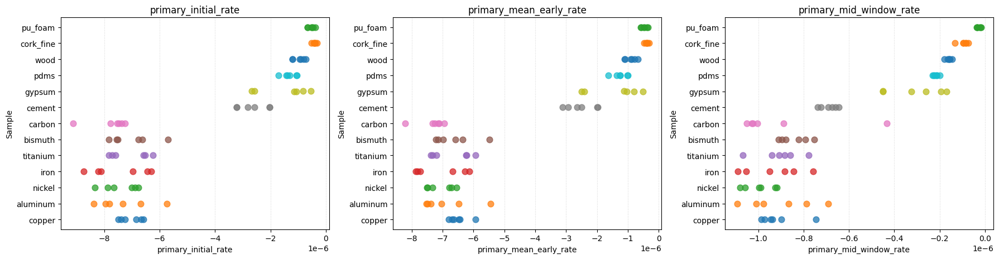

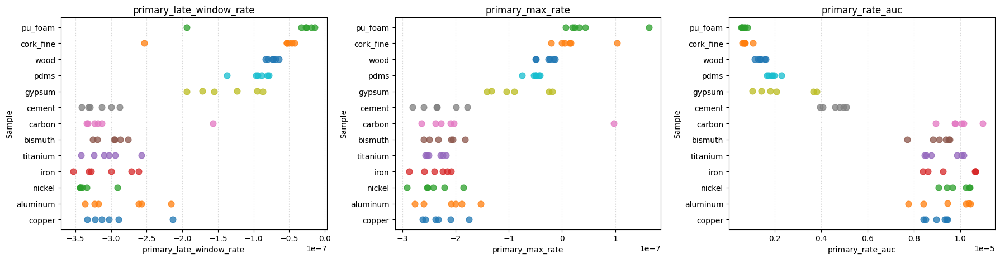

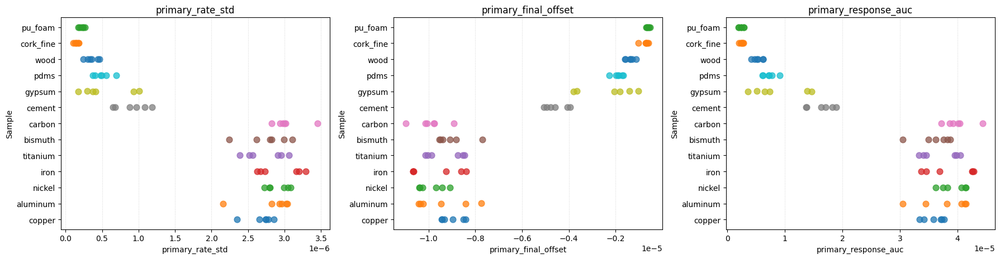

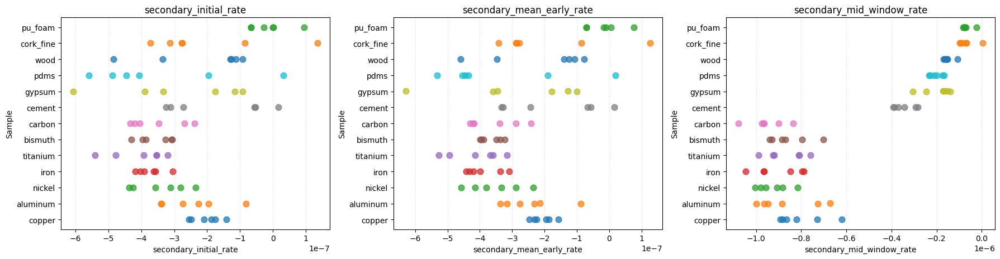

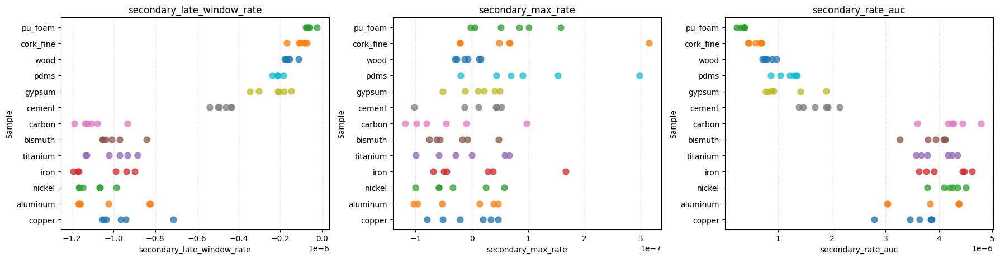

...

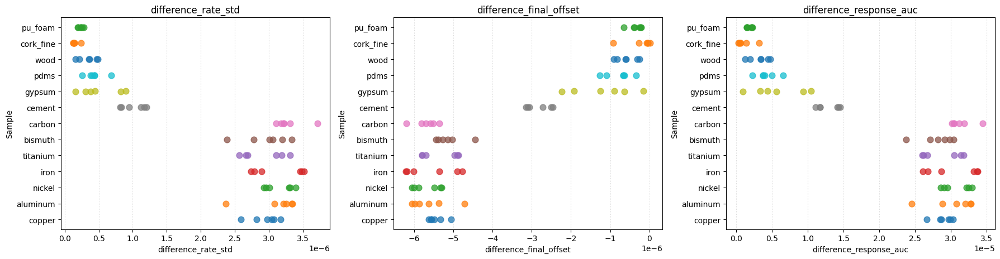

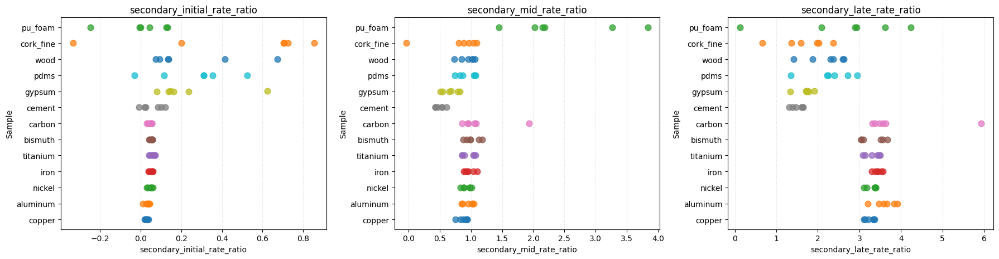

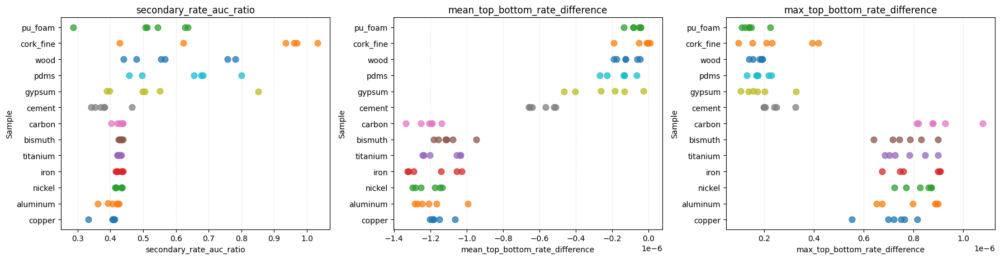

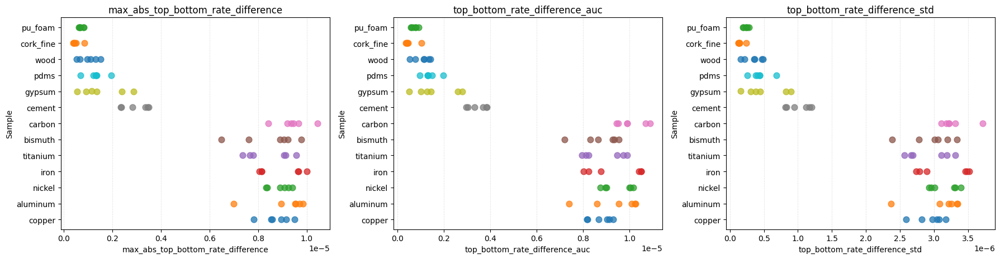

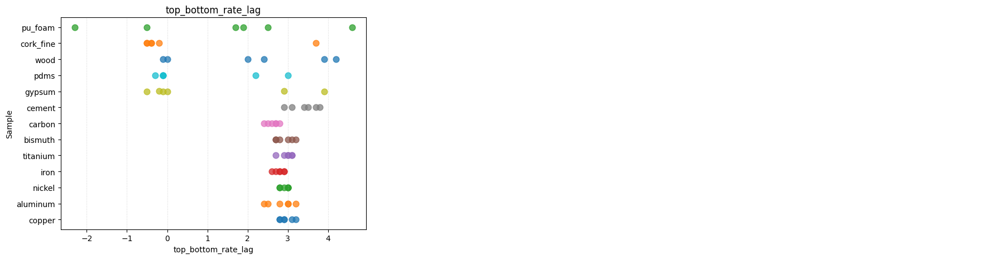

In [141]:
legend_col = "Sample"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    "copper",
    "aluminum",
    "nickel",
    "iron",
    "titanium",
    "bismuth",
    "carbon",
    "cement",
    "gypsum",
    "pdms",
    "wood",
    "cork_fine",
    "cork_coarse",
    "pu_foam",
    "ps_foam",
    "abrasive",      # Polyester foam
]

available_groups = (
    features_df[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = features_df[
                features_df[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    """
    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )
    """

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

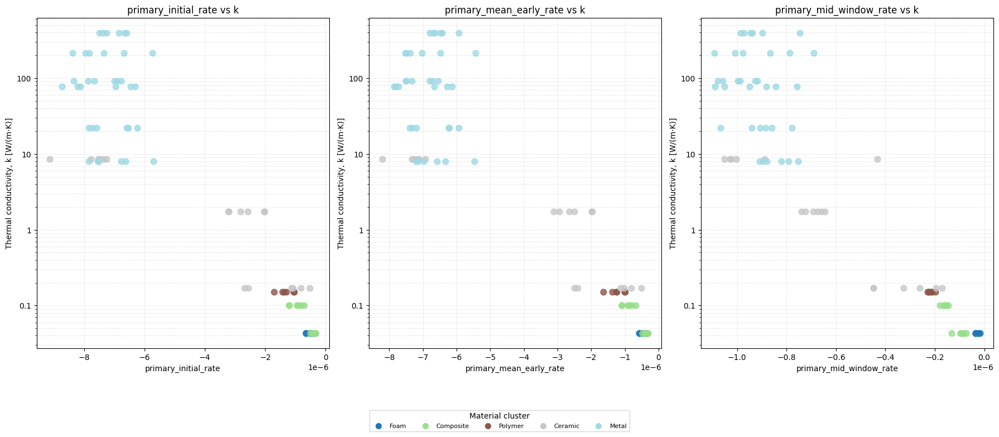

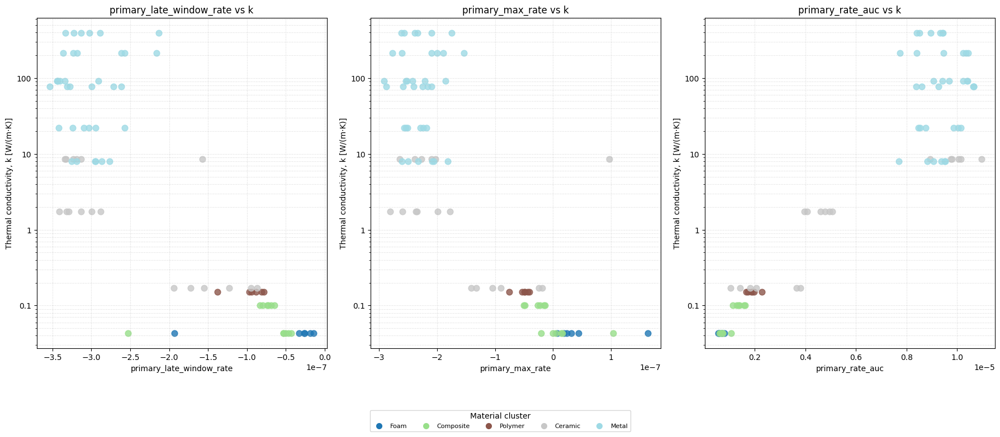

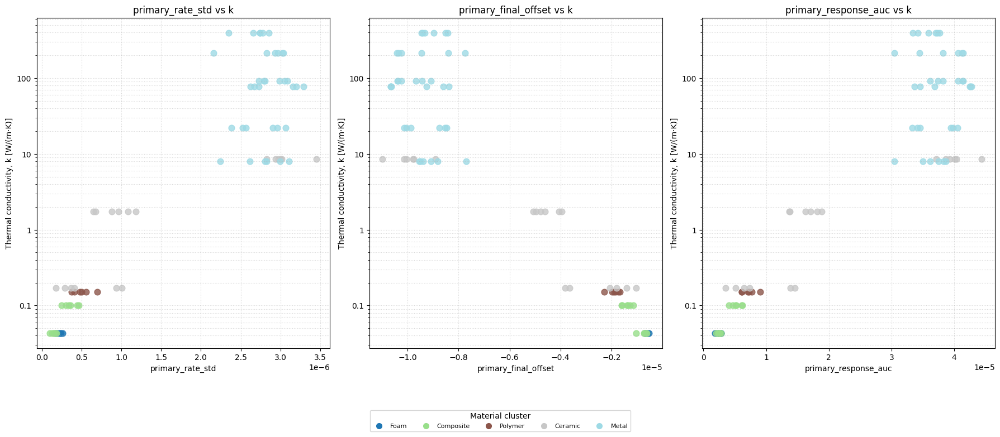

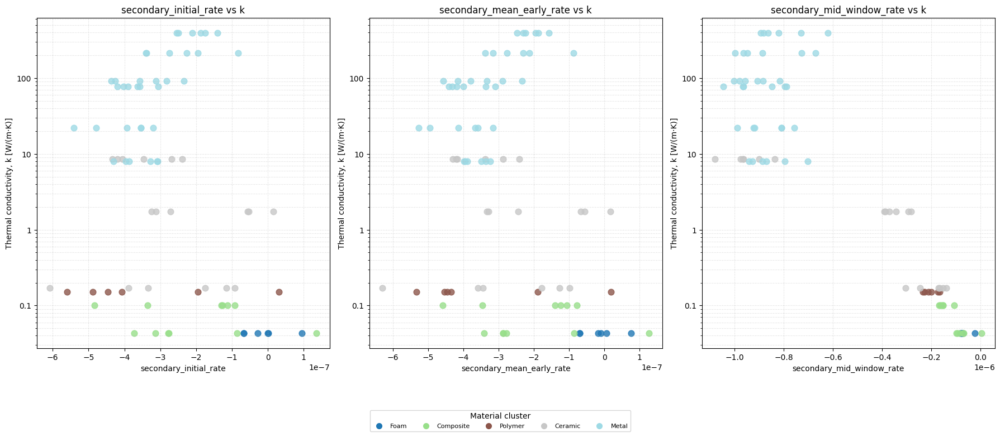

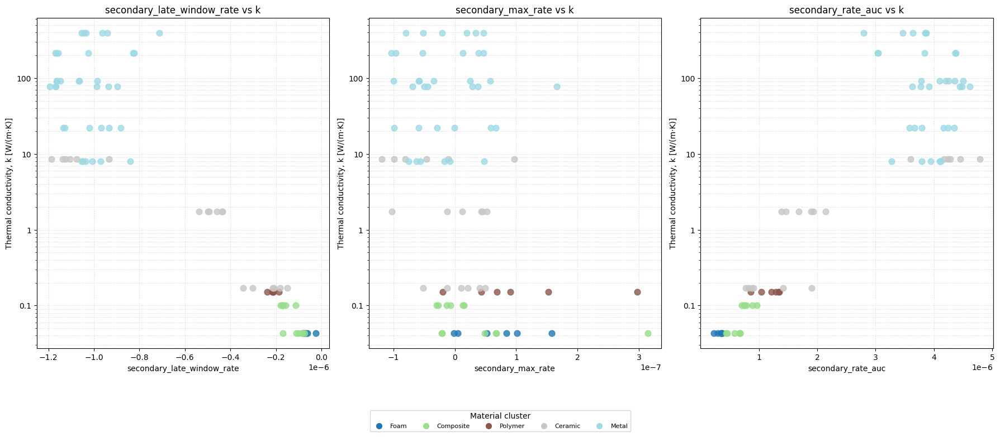

...

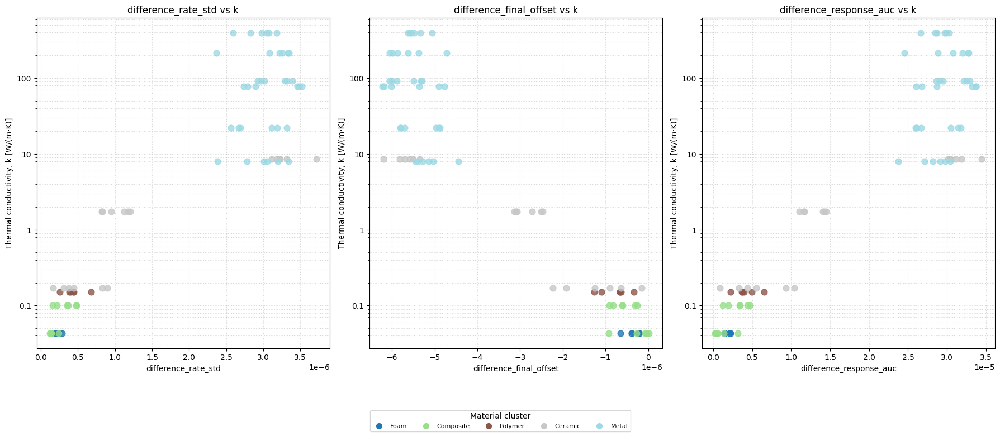

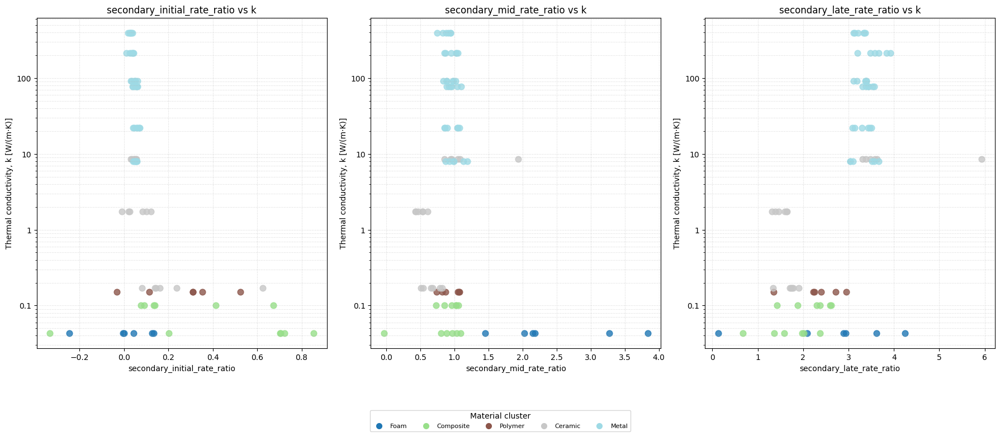

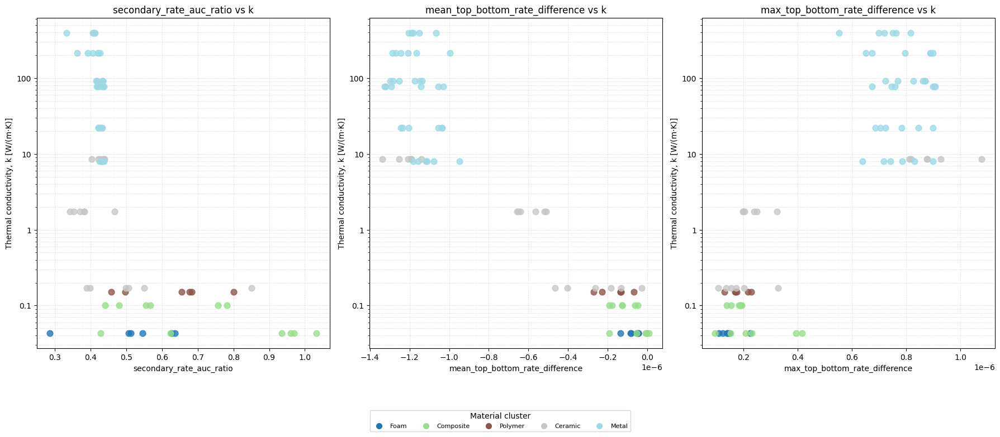

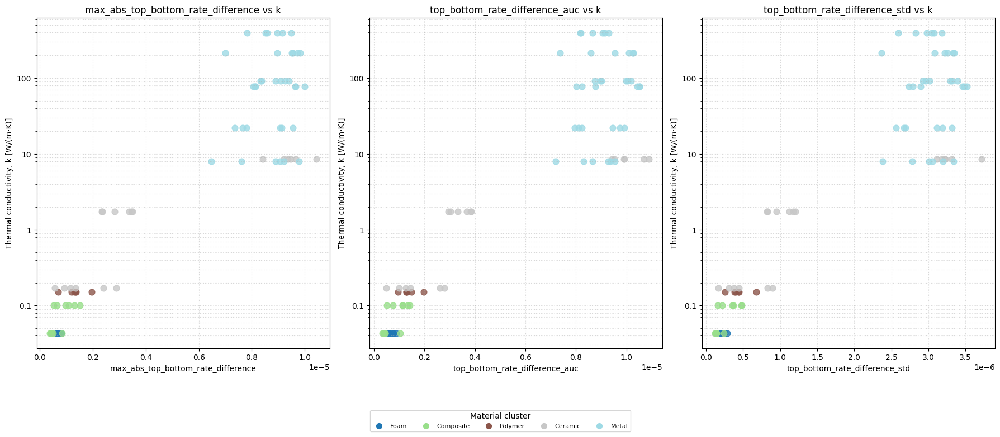

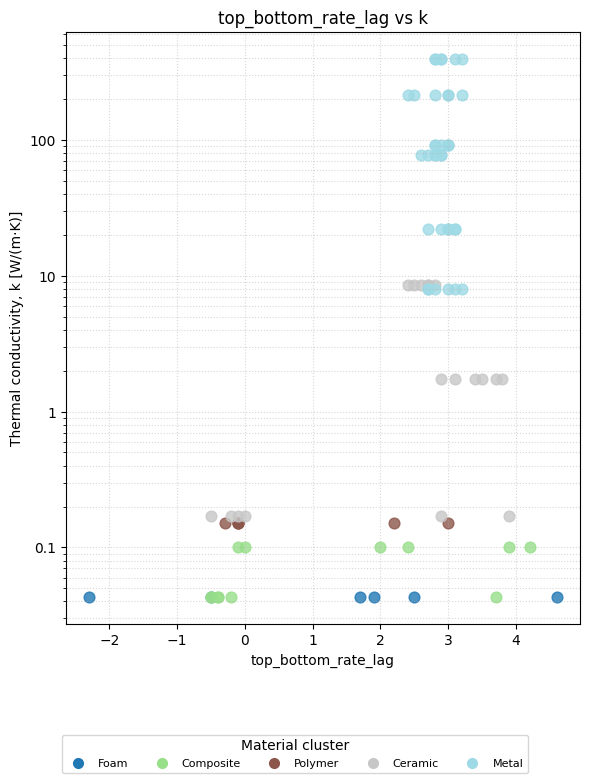

In [142]:
legend_col = "Label"
y_col = "k"
plots_per_fig = 3

# --------------------------------------------------
# Prepare plotting data
# --------------------------------------------------

plot_df = (
    features_df
    .copy()
    .replace([np.inf, -np.inf], np.nan)
)

plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Logarithmic axes require positive values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Keep features containing valid numeric values
# --------------------------------------------------

valid_features = []

for feature in features:

    if feature not in plot_df.columns:
        print(f"Missing feature: {feature}")
        continue

    plot_df[feature] = pd.to_numeric(
        plot_df[feature],
        errors="coerce"
    )

    if plot_df[[feature, y_col]].dropna().empty:
        print(f"No valid numeric values: {feature}")
        continue

    valid_features.append(feature)


# --------------------------------------------------
# Order labels automatically by median k
# --------------------------------------------------

groups = (
    plot_df
    .dropna(subset=[legend_col])
    .groupby(legend_col)[y_col]
    .median()
    .sort_values()
    .index
    .tolist()
)


# --------------------------------------------------
# Assign one consistent color to each label
# --------------------------------------------------

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

group_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Create plots
# --------------------------------------------------

n_figures = math.ceil(
    len(valid_features) / plots_per_fig
)

for fig_num in range(n_figures):

    current_features = valid_features[
        fig_num * plots_per_fig:
        (fig_num + 1) * plots_per_fig
    ]

    n_current = len(current_features)

    fig, axes = plt.subplots(
        1,
        n_current,
        figsize=(6 * n_current, 8),
        squeeze=False
    )

    axes = axes.ravel()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=group_colors[group],
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Major ticks at powers of 10
        ax.yaxis.set_major_locator(
            LogLocator(base=10)
        )

        # Display 0.01, 0.1, 1, 10, 100 instead of scientific notation
        ax.yaxis.set_major_formatter(
            FuncFormatter(
                lambda value, position: f"{value:g}"
            )
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # --------------------------------------------------
    # Shared legend
    # --------------------------------------------------

    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=group_colors[group],
            markeredgecolor=group_colors[group],
            markersize=7,
            label=str(group).replace("_", " ").title()
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material cluster",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    plt.tight_layout(
        rect=[0, 0.14, 1, 1]
    )

    plt.show()

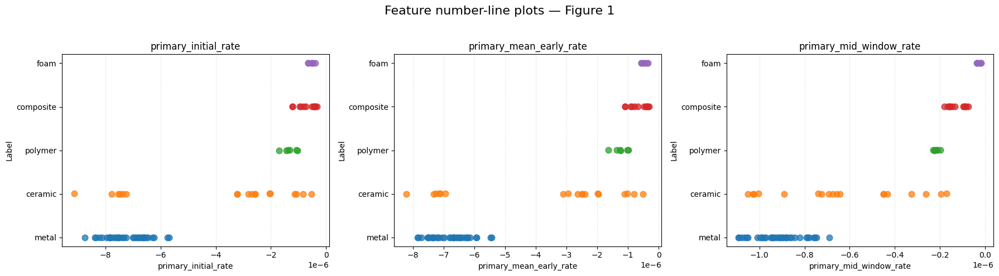

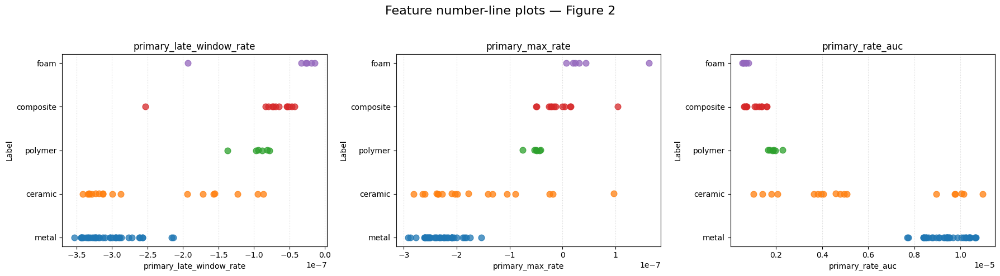

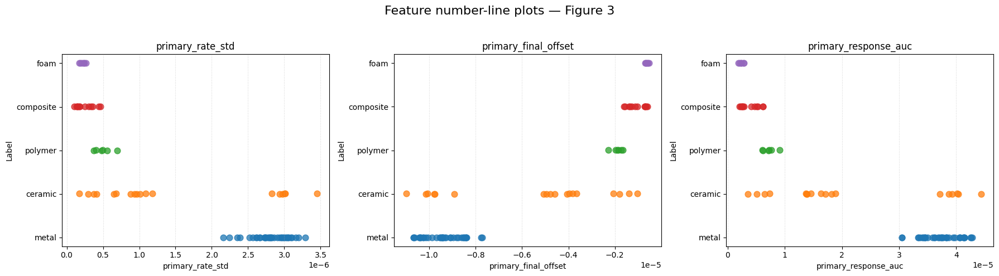

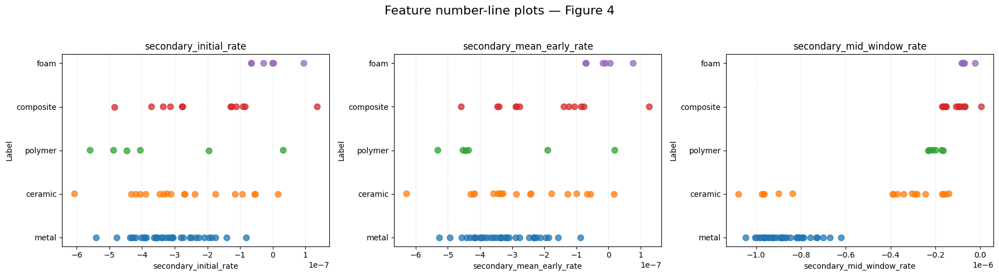

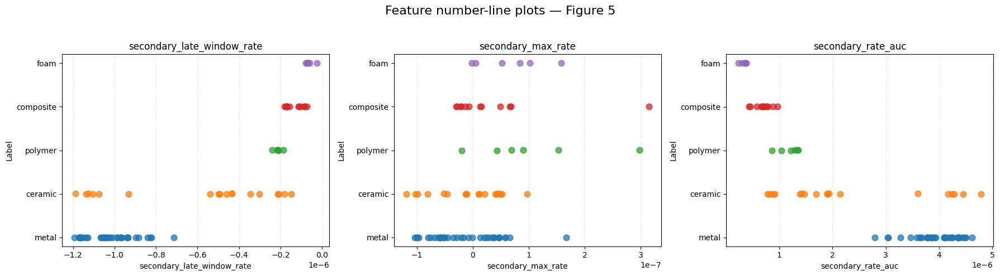

...

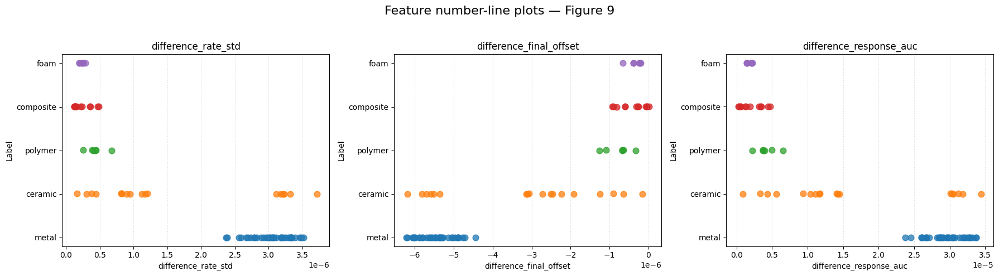

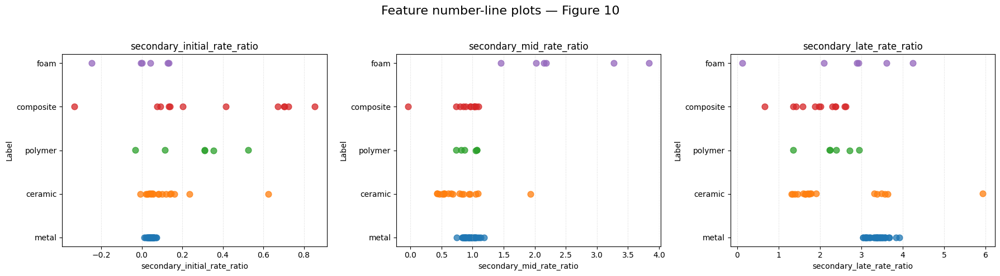

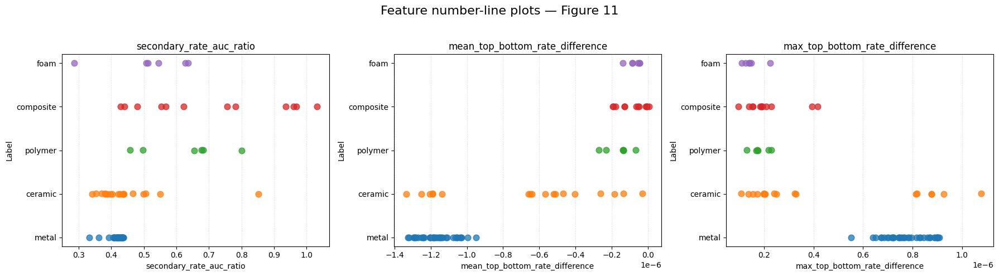

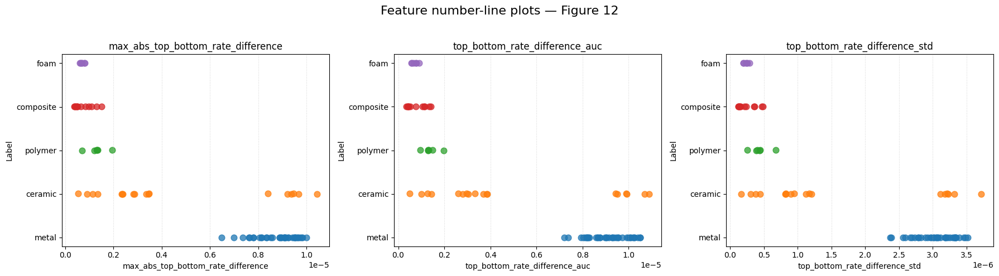

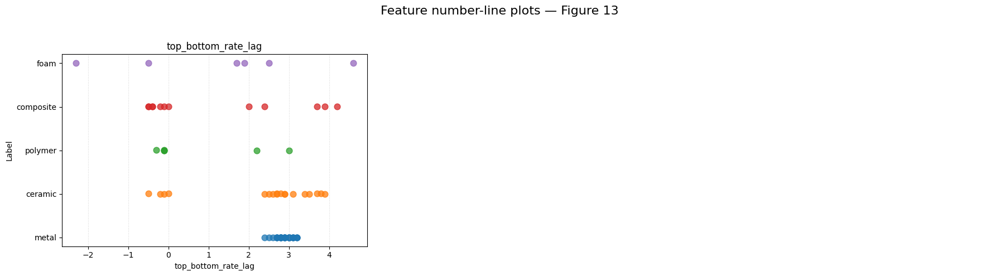

In [143]:
legend_col = "Label"

plots_per_fig = 3
n_cols = 3
n_rows = 1

n_figures = math.ceil(
    len(features) / plots_per_fig
)

desired_order = [
    'metal'
    ,'ceramic'
    ,'polymer'
    ,'composite'
]

available_groups = (
    features_df[legend_col]
    .dropna()
    .unique()
)

groups = [
    group
    for group in desired_order
    if group in available_groups
]

# Include any samples not listed in desired_order
remaining_groups = [
    group
    for group in available_groups
    if group not in groups
]

groups.extend(remaining_groups)


for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 5),
    )

    axes = np.atleast_1d(axes).flatten()

    for ax, feature in zip(
        axes,
        current_features,
    ):

        for group_idx, group in enumerate(groups):

            subset = features_df[
                features_df[legend_col] == group
            ]

            values = pd.to_numeric(
                subset[feature],
                errors="coerce",
            ).dropna()

            if values.empty:
                continue

            y_position = np.full(
                len(values),
                group_idx,
                dtype=float,
            )

            # Small vertical jitter helps reveal overlapping trials
            jitter = np.random.uniform(
                0,
                0.005,
                size=len(values),
            )

            ax.scatter(
                values,
                y_position + jitter,
                label=str(group),
                alpha=0.75,
                s=60,
            )

        ax.set_yticks(
            range(len(groups))
        )

        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5,
        )

    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        (
            "Feature number-line plots — "
            f"Figure {fig_num + 1}"
        ),
        fontsize=16,
    )

    plt.tight_layout(
        rect=[0, 0, 1, 0.95]
    )

    plt.show()

## Principal Component Analysis

In [ ]:
features_df = features_df.dropna(axis = 1)
X = features_df[features]
y = features_df["Sample"]

X_scaled = StandardScaler().fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(7, 5))

for m in features_df['Sample'].unique():
    mask = y == m
    plt.scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=m
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Thermal Response Features")
plt.legend()
plt.tight_layout()
plt.show()

print(pca.explained_variance_ratio_)

In [ ]:
features_df = features_df.dropna(axis = 1)
X = features_df[features_df.columns[6:]]
y = features_df["Sample"]


X_scaled = StandardScaler().fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(7, 5))

for m in features_df['Sample'].unique():
    mask = y == m
    plt.scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=m
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Thermal Response Features")
plt.legend()
plt.tight_layout()
plt.show()

print(pca.explained_variance_ratio_)

## Cumulative Variance Explained

In [ ]:
# explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

x = range(1, len(explained_variance) + 1)

explained_percent = explained_variance * 100
cumulative_percent = cumulative_variance * 100

plt.figure(figsize=(10, 5))

bars = plt.bar(
    x,
    explained_percent,
    alpha=0.5,
    label="Individual explained variance"
)

plt.plot(
    x,
    cumulative_percent,
    marker="o",
    label="Cumulative explained variance"
)

# label individual explained variance bars
for i, value in enumerate(explained_percent, start=1):
    plt.text(
        i,
        value + 1,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

# label cumulative explained variance points
for i, value in enumerate(cumulative_percent, start=1):
    plt.text(
        i,
        value + 2,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

plt.xlabel("Principal component")
plt.ylabel("Explained variance (%)")
plt.title("PCA Explained Variance")
plt.xticks(x)
plt.ylim(0, 110)
plt.legend()
plt.tight_layout()
plt.show()

# Simple Logistic Regression

In [ ]:
def multiclass_logistic_cv(
    df,
    features,
    target_col,
    group_col=None,
    random_state=42,
    class_weight=None,
    class_order=(
        "foam",
        "composite",
        "polymer",
        "ceramic",
        "metal",
    ),
):
    """
    Evaluate multiclass logistic regression using cross-validation.
    """

    required_cols = features + [target_col]

    if group_col is not None:
        required_cols.append(group_col)

    work_df = (
        df[required_cols]
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=[target_col])
        .copy()
    )

    X = work_df[features]
    y = work_df[target_col]

    # Arrange classes in the requested thermal-conductivity order.
    # Any additional classes are placed at the end.
    present_classes = list(pd.unique(y))

    ordered_classes = [
        label
        for label in class_order
        if label in present_classes
    ]

    ordered_classes.extend(
        label
        for label in present_classes
        if label not in ordered_classes
    )

    # ---------------------------------------------
    # Select cross-validation strategy
    # ---------------------------------------------

    if group_col is None:

        smallest_class = int(
            y.value_counts().min()
        )

        n_splits = min(
            5,
            smallest_class,
        )

        if n_splits < 2:
            raise ValueError(
                "Each class must contain at least "
                "two observations."
            )

        cv = StratifiedKFold(
            n_splits=n_splits,
            shuffle=True,
            random_state=random_state,
        )

        groups = None

    else:

        groups = work_df[group_col]

        groups_per_class = (
            work_df
            .groupby(target_col)[group_col]
            .nunique()
        )

        n_splits = min(
            5,
            int(groups_per_class.min()),
        )

        if n_splits < 2:
            raise ValueError(
                "Each class must occur in at least "
                "two independent groups."
            )

        cv = StratifiedGroupKFold(
            n_splits=n_splits,
            shuffle=True,
            random_state=random_state,
        )

    # ---------------------------------------------
    # Model pipeline
    # ---------------------------------------------

    model = Pipeline([
        (
            "imputer",
            SimpleImputer(strategy="median"),
        ),
        (
            "remove_constant_features",
            VarianceThreshold(),
        ),
        (
            "scaler",
            StandardScaler(),
        ),
        (
            "classifier",
            LogisticRegression(
                penalty="l2",
                solver="lbfgs",
                C=1.0,
                max_iter=5000,
                class_weight=class_weight,
            ),
        ),
    ])

    scoring = {
        "accuracy": "accuracy",
        "balanced_accuracy": "balanced_accuracy",
        "macro_f1": "f1_macro",
    }

    cv_arguments = {
        "estimator": model,
        "X": X,
        "y": y,
        "cv": cv,
        "scoring": scoring,
        "n_jobs": -1,
    }

    prediction_arguments = {
        "estimator": model,
        "X": X,
        "y": y,
        "cv": cv,
        "n_jobs": -1,
    }

    if groups is not None:
        cv_arguments["groups"] = groups
        prediction_arguments["groups"] = groups

    # ---------------------------------------------
    # Cross-validated evaluation
    # ---------------------------------------------

    scores = cross_validate(
        **cv_arguments
    )

    predictions = cross_val_predict(
        **prediction_arguments
    )

    for metric in scoring:

        values = scores[f"test_{metric}"]

        print(
            f"{metric}: "
            f"{values.mean():.3f} ± "
            f"{values.std():.3f}"
        )

    print("\nClass order:")
    print(" → ".join(map(str, ordered_classes)))

    print("\nCross-validated classification report:")

    print(
        classification_report(
            y,
            predictions,
            labels=ordered_classes,
            target_names=[
                str(label)
                for label in ordered_classes
            ],
            zero_division=0,
        )
    )

    ConfusionMatrixDisplay.from_predictions(
        y,
        predictions,
        labels=ordered_classes,
        display_labels=[
            str(label).replace("_", " ").title()
            for label in ordered_classes
        ],
        cmap="Blues",
        xticks_rotation=45,
    )
 
    plt.title(
        "Cross-validated multiclass logistic regression"
    )

    plt.xlabel("Predicted material cluster")
    plt.ylabel("Actual material cluster")

    plt.tight_layout()
    plt.show()

    # Fit final model using the complete dataset
    final_model = model.fit(X, y)

    return final_model, scores, predictions

In [ ]:
excluded_cols = [
    "Sample",
    "Trial",
    "Label",
    "k",
    "index",
    "elbow_time",
    "elbow_idx",
    "elbow_value",
    "is_elbow",
]

model_features = [
    col
    for col in features_df.select_dtypes(include=np.number).columns
    if col not in excluded_cols
]

model, scores, predictions = multiclass_logistic_cv(
    df=features_df,
    features=model_features,
    target_col="Label",
    random_state=42,
    class_order=[
        "foam",
        "composite",
        "polymer",
        "ceramic",
        "metal",
    ],
)

In [ ]:
multi_class_logistic(features_df.dropna(axis = 1), features_df.dropna(axis = 1).columns[7:-1], 'Label', random_state = 42)


# `tsfresh` Feature Extraction

In [ ]:
# organized tsfresh settings
_basic = [
    "mean", "median", "minimum", "maximum", "absolute_maximum"
]

_variability = [
    "standard_deviation", "variance", "root_mean_square",
    "mean_abs_change", "mean_change"
]

_distribution = ["skewness", "kurtosis"]
_energy = ["abs_energy", "sum_values"]
_counts = ["count_above_mean", "count_below_mean"]
_strikes = ["longest_strike_above_mean", "longest_strike_below_mean"]

_linear_trend = [{"attr": a} for a in ("slope", "intercept", "rvalue", "pvalue", "stderr")]
_autocorr = [{"lag": l} for l in (1, 2, 5, 10)]
_change_quantiles = [
    {"ql": 0.0, "qh": 0.2, "isabs": False, "f_agg": "mean"},
    {"ql": 0.0, "qh": 0.2, "isabs": True,  "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": False, "f_agg": "mean"},
    {"ql": 0.8, "qh": 1.0, "isabs": True,  "f_agg": "mean"},
]
_cid_ce = [{"normalize": True}, {"normalize": False}]

settings = {k: None for k in (_basic + _variability + _distribution + _energy + _counts + _strikes)}
settings.update({
    "linear_trend": _linear_trend,
    "autocorrelation": _autocorr,
    "change_quantiles": _change_quantiles,
    "cid_ce": _cid_ce,
})


In [ ]:
# use only filtered data
ts_data = data[(data["filter"])]

# create one ID per material-trial
ts_data["id"] = (
    ts_data["Sample"].astype(str) +
    "_trial_" +
    ts_data["Trial"].astype(int).astype(str)
)

# primary sensor table
primary = ts_data[[
    "id",
    "Time",
    "Primary",
    "k"
]].copy()

primary = primary.rename(columns={
    "Time": "time",
    "Primary": "value"
})

primary["kind"] = "Primary"

# secondary sensor table
secondary = ts_data[[
    "id",
    "Time",
    "Secondary"
]].copy()

secondary = secondary.rename(columns={
    "Time": "time",
    "Secondary": "value"
})

secondary["kind"] = "Secondary"


# diff sensor table
diff = ts_data[[
    "id",
    "Time",
    "diff"
]].copy()

diff = diff.rename(columns={
    "Time": "time",
    "diff": "value"
})

diff["kind"] = "Difference"

# combine primary and secondary
tsfresh_input = pd.concat(
    [primary, secondary, diff],
    ignore_index=True
)

tsfresh_input = tsfresh_input[[
    "id",
    "time",
    "kind",
    "value",
    "k"
]]

# clean invalid values
tsfresh_input = tsfresh_input.replace([np.inf, -np.inf], np.nan)
tsfresh_input = tsfresh_input.dropna()

In [ ]:
tsfresh_features = extract_features(
    tsfresh_input,
    column_id="id",
    column_sort="time",
    column_kind="kind",
    column_value="value",
    default_fc_parameters=settings,
    n_jobs=0
)

In [ ]:
labels = (
    ts_data[["id", "Sample", "Trial", "Label"]]
    .drop_duplicates()
    .set_index("id")
)
tsfresh_features = tsfresh_features.dropna(axis=1)


tsfresh_features = tsfresh_features.join(labels)
tsfresh_features = tsfresh_features.reset_index()
#tsfresh_features = tsfresh_features.join(ts)
tsfresh_features.head()

In [ ]:
# -index ; - trial

legend_col = "Sample"

# Automatically select numeric features,
# excluding identifiers and elbow_time
excluded_cols = ["Sample", "Trial", "index"]

features = [
    col
    for col in tsfresh_features.select_dtypes(include=np.number).columns
    if col not in excluded_cols
]

plots_per_fig = 9
n_cols = 3
n_rows = 3

n_figures = math.ceil(len(features) / plots_per_fig)

# Keep the same sample order in every subplot
groups = tsfresh_features[legend_col].dropna().unique()

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig
    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(axes, current_features):

        for group_idx, group in enumerate(groups):

            subset = tsfresh_features[
                tsfresh_features[legend_col] == group
            ]

            # Convert to numeric and remove NaN values
            values = pd.to_numeric(
                subset[feature],
                errors="coerce"
            ).dropna()

            # Place every sample on its own horizontal level
            y_position = np.full(
                len(values),
                group_idx
            )

            ax.scatter(
                values,
                y_position,
                label=str(group),
                alpha=0.75,
                s=60
            )

        ax.set_yticks(range(len(groups)))
        ax.set_yticklabels(groups)

        ax.set_xlabel(feature)
        ax.set_ylabel(legend_col)
        ax.set_title(feature)

        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.5
        )

    # Hide unused plots in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")

    fig.suptitle(
        f"Feature number-line plots — Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [ ]:
legend_col = "Sample"
y_col = "k"

plots_per_fig = 9
n_cols = 3
n_rows = 3


# --------------------------------------------------
# Prepare data
# --------------------------------------------------

plot_df = tsfresh_features.copy()

# Replace infinite values with NaN
plot_df = plot_df.replace(
    [np.inf, -np.inf],
    np.nan
)

# Ensure k is numeric
plot_df[y_col] = pd.to_numeric(
    plot_df[y_col],
    errors="coerce"
)

# Log scale requires positive k values
plot_df = plot_df[
    plot_df[y_col] > 0
].copy()


# --------------------------------------------------
# Select numeric tsfresh features
# --------------------------------------------------

excluded_cols = [
    "Sample",
    "Trial",
    "index",
    "k",
    "elbow_time"
]

candidate_features = [
    col
    for col in plot_df.select_dtypes(
        include=np.number
    ).columns
    if col not in excluded_cols
]


# Drop feature columns containing any NaN
features = [
    col
    for col in candidate_features
    if plot_df[col].notna().all()
]

dropped_features = [
    col
    for col in candidate_features
    if col not in features
]

print(
    f"Features retained: {len(features)}"
)

print(
    f"Features removed because of NaN: "
    f"{len(dropped_features)}"
)


# --------------------------------------------------
# Create one consistent color per material
# --------------------------------------------------

groups = (
    plot_df[legend_col]
    .dropna()
    .unique()
)

cmap = plt.get_cmap(
    "tab20",
    len(groups)
)

material_colors = {
    group: cmap(i)
    for i, group in enumerate(groups)
}


# --------------------------------------------------
# Plot k against each tsfresh feature
# --------------------------------------------------

n_figures = math.ceil(
    len(features) / plots_per_fig
)

for fig_num in range(n_figures):

    start = fig_num * plots_per_fig
    end = start + plots_per_fig

    current_features = features[start:end]

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(18, 15)
    )

    axes = axes.flatten()

    for ax, feature in zip(
        axes,
        current_features
    ):

        for group in groups:

            subset = plot_df[
                plot_df[legend_col] == group
            ].dropna(
                subset=[feature, y_col]
            )

            if subset.empty:
                continue

            ax.scatter(
                subset[feature],
                subset[y_col],
                color=material_colors[group],
                label=str(group),
                alpha=0.8,
                s=60
            )

        ax.set_xlabel(feature)

        ax.set_ylabel(
            "Thermal conductivity, k [W/(m·K)]"
        )

        ax.set_title(
            f"{feature} vs k"
        )

        # Logarithmic numeric y-axis
        ax.set_yscale("log")

        # Show ordinary numeric labels
        ax.yaxis.set_major_formatter(
            ScalarFormatter()
        )

        ax.grid(
            which="both",
            linestyle=":",
            alpha=0.5
        )


    # Hide unused axes in the final figure
    for ax in axes[len(current_features):]:
        ax.axis("off")


    # Shared legend with multiple materials per row
    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="",
            markerfacecolor=material_colors[group],
            markeredgecolor=material_colors[group],
            markersize=7,
            label=str(group)
        )
        for group in groups
    ]

    fig.legend(
        handles=legend_handles,
        title="Material",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.01),
        ncol=min(8, len(groups)),
        fontsize=8
    )

    fig.suptitle(
        f"Thermal conductivity vs tsfresh features "
        f"— Figure {fig_num + 1}",
        fontsize=16
    )

    plt.tight_layout(
        rect=[0, 0.10, 1, 0.97]
    )

    plt.show()

## Principal Component Analysis

In [ ]:
feature_cols = tsfresh_features.drop(columns=["index", "Sample", "Trial", "Label"]).columns
feature_cols = [c for c in feature_cols if 'Difference' not in c]

X = tsfresh_features[tsfresh_features['Sample'] != 'pu_foam'][feature_cols]
y = tsfresh_features[tsfresh_features['Sample'] != 'pu_foam']["Label"]

X_scaled = StandardScaler().fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(7, 5))

for m in y.unique():
    mask = y == m
    plt.scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=m
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of tsfresh Features")
plt.legend()
plt.tight_layout()
plt.show()

## Cumulative Variance Explained

In [ ]:
# explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

x = range(1, len(explained_variance) + 1)

explained_percent = explained_variance * 100
cumulative_percent = cumulative_variance * 100

plt.figure(figsize=(10, 5))

bars = plt.bar(
    x,
    explained_percent,
    alpha=0.5,
    label="Individual explained variance"
)

plt.plot(
    x,
    cumulative_percent,
    marker="o",
    label="Cumulative explained variance"
)

# label individual explained variance bars
for i, value in enumerate(explained_percent, start=1):
    plt.text(
        i,
        value + 1,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

# label cumulative explained variance points
for i, value in enumerate(cumulative_percent, start=1):
    plt.text(
        i,
        value + 2,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

plt.xlabel("Principal component")
plt.ylabel("Explained variance (%)")
plt.title("PCA Explained Variance")
plt.xticks(x)
plt.ylim(0, 110)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
tsfresh_features.columns[1:-3]

In [ ]:
multi_class_logistic(tsfresh_features.dropna(axis = 1), tsfresh_features.dropna(axis = 1).columns[1:-3], 'Label', random_state = 42)

# Reservoir Computing

In [ ]:
rc_data = (
    data
    .copy()
    .sort_values(["Label", "Sample", "Trial", "Time"])
)

sequence_data = []

# --------------------------------------------------
# Calculate difference and differential curves
# separately for every trial
# --------------------------------------------------

for (label, sample, trial), subset in rc_data.groupby(
    ["Label", "Sample", "Trial"],
    sort=False
):
    subset = (
        subset
        .sort_values("Time")
        .dropna(subset=["Time", "Primary", "Secondary"])
        .drop_duplicates(subset="Time")
        .copy()
    )

    # At least two points are required for a derivative
    if len(subset) < 2:
        print(f"Skipped: {sample}, Trial {trial}")
        continue

    time = subset["Time"].to_numpy(dtype=float)
    primary = subset["Primary"].to_numpy(dtype=float)
    secondary = subset["Secondary"].to_numpy(dtype=float)

    # Difference between the two sensors
    difference = primary - secondary

    # First derivatives with respect to time
    primary_diff = np.gradient(primary, time)
    secondary_diff = np.gradient(secondary, time)
    difference_diff = np.gradient(difference, time)

    subset["Difference"] = difference
    subset["Primary_diff"] = primary_diff
    subset["Secondary_diff"] = secondary_diff
    subset["Difference_diff"] = difference_diff

    sequence_data.append({
        "Label": label,
        "Sample": sample,
        "Trial": trial,
        "data": subset
    })


# --------------------------------------------------
# Find the shortest valid trial
# --------------------------------------------------

min_len = min(
    len(item["data"])
    for item in sequence_data
)

print("Minimum sequence length:", min_len)


# --------------------------------------------------
# Build reservoir-computing inputs
# --------------------------------------------------

input_columns = [
    "Primary",
    "Secondary",
    "Difference",
    "Primary_diff",
    "Secondary_diff",
    "Difference_diff"
]

X_list = []
y_list = []

for item in sequence_data:

    subset = item["data"].head(min_len)

    sequence = subset[
        input_columns
    ].to_numpy(dtype=float)

    X_list.append(sequence)
    y_list.append(item["Label"])


# Shape:
# samples × time points × input channels
X = np.stack(X_list)
y = np.asarray(y_list)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Input channels:", input_columns)


# --------------------------------------------------
# Encode labels
# --------------------------------------------------

le = LabelEncoder()

y_encoded = le.fit_transform(y)

print("Classes:", le.classes_)
print("Encoded labels:", y_encoded)

In [ ]:
X_rc = []

reservoir = Reservoir(
    units=50,
    sr=0.9,
    lr=0.3,
    input_scaling=0.5,
    seed=42
)

for sequence_idx, sequence in enumerate(X):

    sequence = np.asarray(sequence, dtype=float)

    primary = sequence[:, 0]
    secondary = sequence[:, 1]

    difference = primary - secondary

    primary_diff = np.gradient(primary)
    secondary_diff = np.gradient(secondary)
    difference_diff = np.gradient(difference)

    rc_sequence = np.column_stack([
        primary,
        secondary,
        difference,
        primary_diff,
        secondary_diff,
        difference_diff
    ])

    # The first run initializes the reservoir.
    # Reset only before subsequent independent sequences.
    if sequence_idx > 0:
        reservoir.reset()

    states = reservoir.run(rc_sequence)

    rc_features = np.concatenate([
        states.mean(axis=0),
        states.std(axis=0),
        states[-1]
    ])

    X_rc.append(rc_features)

X_rc = np.asarray(X_rc)

print("RC input shape:", rc_sequence.shape)
print("X_rc shape:", X_rc.shape)

## Principal Component Analysis

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_rc)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

materials = np.unique(y)

plt.figure(figsize=(8, 6))

for m in materials:
    mask = y == m

    plt.scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=m,
        s=60
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA of Reservoir Computing Features")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

x = range(1, len(explained_variance) + 1)

explained_percent = explained_variance * 100
cumulative_percent = cumulative_variance * 100

plt.figure(figsize=(10, 5))

bars = plt.bar(
    x,
    explained_percent,
    alpha=0.5,
    label="Individual explained variance"
)

plt.plot(
    x,
    cumulative_percent,
    marker="o",
    label="Cumulative explained variance"
)

# label individual explained variance bars
for i, value in enumerate(explained_percent, start=1):
    plt.text(
        i,
        value + 1,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

# label cumulative explained variance points
for i, value in enumerate(cumulative_percent, start=1):
    plt.text(
        i,
        value + 2,
        f"{value:.1f}%",
        ha="center",
        va="bottom",
        fontsize=8
    )

plt.xlabel("Principal component")
plt.ylabel("Explained variance (%)")
plt.title("PCA Explained Variance")
plt.xticks(x)
plt.ylim(0, 110)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
rc_df = pd.DataFrame(X_rc)
rc_df['Label'] = y_list

In [ ]:
multi_class_logistic(rc_df, rc_df.columns[:-1], 'Label', random_state = 42)